<a href="https://colab.research.google.com/github/Yuanranzhu/SINN/blob/main/FPU_chain_SINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!hostname

gnode014.cluster


In [2]:
!nvidia-smi

Mon Mar  4 18:35:51 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               Off | 00000000:A8:00.0 Off |                    0 |
| N/A   34C    P0              77W / 350W |   8671MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import itertools as it
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.fft
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sdeint
from toolbox import (
    make_loss,
    StatLoss,
    SINN,
    FPU
)
import time

In [4]:
torch.cuda.is_available()

True

In [5]:
device = torch.device('cuda')

In [6]:
print(torch.__version__)
print(torch.version.cuda)

2.0.1+cu118
11.8


In [7]:
seed = 1234
torch.set_default_dtype(torch.float)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

In [8]:
%%time

######### Generating SINN training data by solving SDE
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.integrate import quad



###### Parameters 
mag=1              # Magnitude of the coupling
beta=1             # Inverse temperature 
alpha=1            
gamma=1            # Anharmonic potential U(x)=alpha/2* x^2  + gamma/4* x^4
N=100              # Total number of oscillators in the chain 
N_mid=int(N/2)     # Coordinate of the center CG-oscillator 
dt=0.01 
delta_t=0.5
batch = 400
sec_length = 400

Time = 5*delta_t*sec_length
print(Time)
length=int(Time/dt)+1
t = np.linspace(0,Time,length) # define time axis
gap=int(delta_t/dt)
t_store=t[0:-1:gap]



# (q49,q50)
q49_store = np.zeros([t_store.size+1,batch])    
q50_store = np.zeros([t_store.size+1,batch])

q=np.zeros((1,length)) 

p1=np.zeros((N,batch))
q1=np.zeros((N,batch))
p0=np.zeros((N,batch))
q0=np.zeros((N,batch))

# solve SDE

j=1
for i in range(1,length):
    q1=q0+dt*(p0-np.roll(p0,1,axis=0))
    p1=(1-mag*dt)*p0+dt*alpha*(np.roll(q0,-1,axis=0)-q0)+dt*gamma*(np.roll(q0,-1,axis=0)**3-q0**3)+np.sqrt(2*dt*gamma/beta)*np.random.randn(N,batch)
    if i % gap ==0:        
        q49_store[j,:]= np.sum(q1[0:N_mid-1,:], axis=0)
        q50_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        j=j+1
    p0=p1
    q0=q1
                                
Toss=int(t_store.size/4)
q49_store=q49_store[Toss:-1,:] 
q50_store=q50_store[Toss:-1,:] 

1000.0
CPU times: user 9min 9s, sys: 15.3 ms, total: 9min 9s
Wall time: 9min 10s


Text(0.5, 1.0, 'Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$')

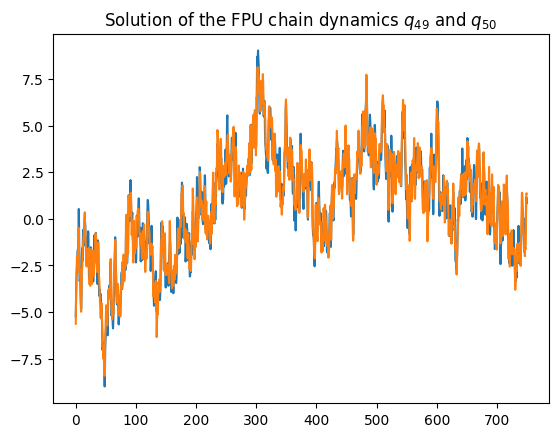

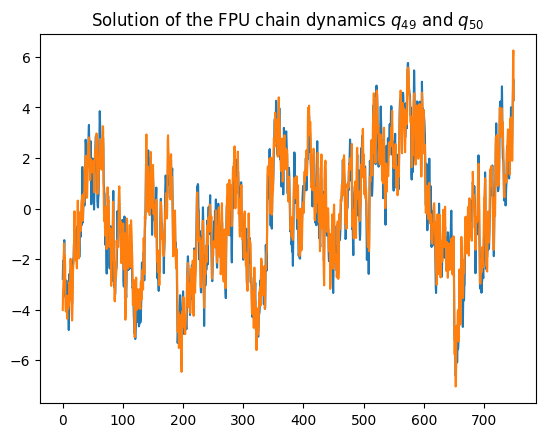

In [9]:
plt.figure(0)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

plt.figure(1)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,1])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,1])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

(400, 400) (400, 400) (400, 400)
(400, 400) (400, 400, 2)


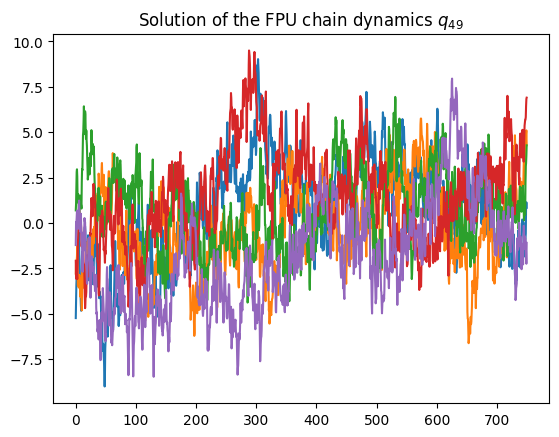

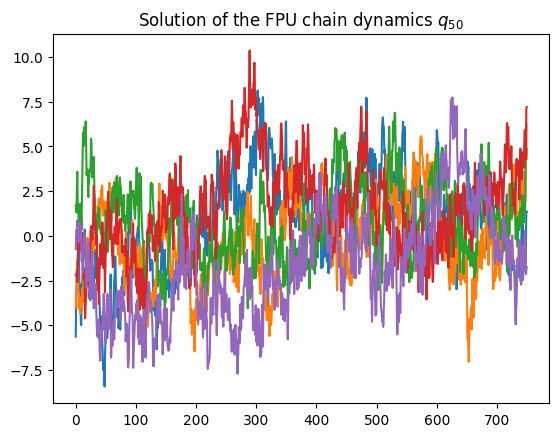

In [10]:
plt.figure(0)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$")

plt.figure(1)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{50}$")

###########################################   Construct the sample traj for the LSTM learning 
ini=np.random.randn(sec_length,batch)
Traj49 = q49_store[0:sec_length,:]
Traj50 = q50_store[0:sec_length,:]
print(ini.shape, Traj49.shape, Traj50.shape)

Traj = np.empty((sec_length,batch,2))
Traj[:,:,0] = Traj49
Traj[:,:,1] = Traj50
T=np.arange(len(Traj[:,1]))*delta_t
x=np.linspace(-5,5,sec_length)
print(ini.shape, Traj.shape)

In [11]:
# Reformulating data into Torch tensors 
# Input of SINN should be of the form (seq_len, batch, input_size)

ini = np.random.randn(2*sec_length,2*batch).astype(np.float32) 
input = torch.from_numpy(ini.reshape(2*sec_length, batch, 2)).to(device)
batch_validation = batch
val_set = torch.normal(0.0, 1.0, (2*sec_length, batch_validation, 2), device=device)


Traj = Traj.astype(np.float32) 
target = torch.from_numpy(Traj.reshape(sec_length, batch, 2)).to(device)
print('The torch input size is', input.size(), input.dtype)
print('The torch validation size is', val_set.size(), val_set.dtype)
print('The torch target size is', target.size(), target.dtype)

The torch input size is torch.Size([800, 400, 2]) torch.float32
The torch validation size is torch.Size([800, 400, 2]) torch.float32
The torch target size is torch.Size([400, 400, 2]) torch.float32


In [12]:
# Defining Loss functions
LAGS = 400
N = 400
loss_acf_fft = make_loss('acf[fft]', target, lags=LAGS, device=device)
loss_acf_sec_moment = make_loss('acf[fft]', target**2, lags=LAGS, device=device)
loss_acf_bruteforce = make_loss('acf[bruteforce]', target, lags=LAGS, device=device)
loss_acf_randbrute = make_loss('acf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_ccf_fft = make_loss('ccf[fft]', target, lags=LAGS, device=device)
loss_ccf_sec_moment = make_loss('ccf[fft]', target**2, lags=LAGS, device=device)
loss_ccf_bruteforce = make_loss('ccf[bruteforce]', target, lags=LAGS, device=device)
loss_ccf_randbrute = make_loss('ccf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_pdf_empirical1 = make_loss('pdf', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2 = make_loss('pdf6', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2D = make_loss('pdf2D', target, lower=-5, upper=5, n=N, bw=None, device=device)

torch.Size([400, 2])


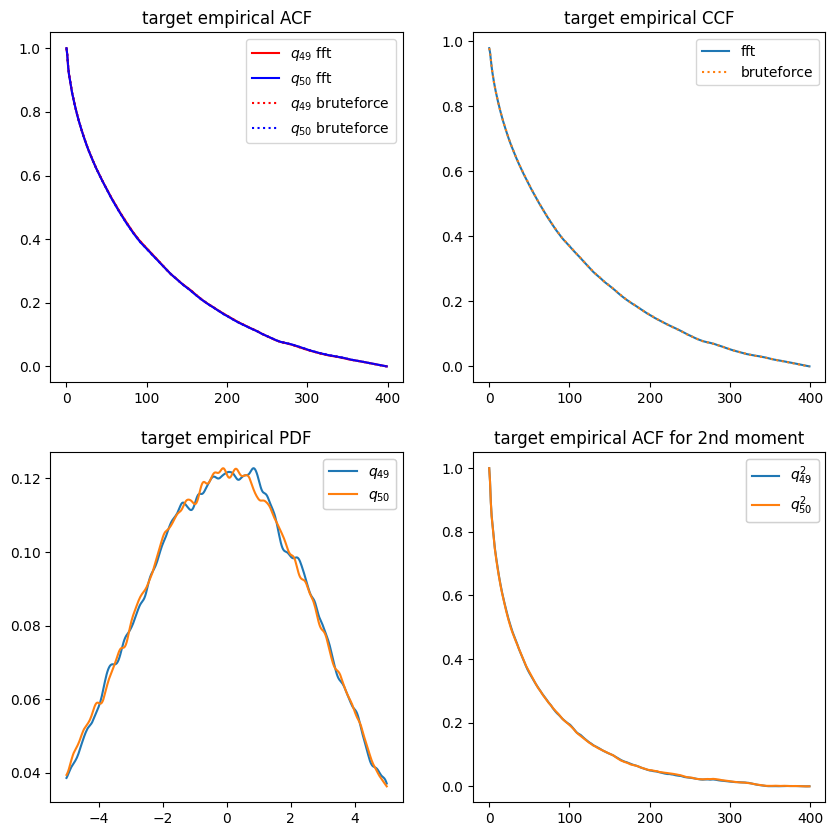

In [13]:
# Plotting target ACFs and PDF
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].plot(loss_acf_fft._target.cpu()[...,0],'r', label=r'$q_{49}$ fft')
axs[0,0].plot(loss_acf_fft._target.cpu()[...,1],'b', label=r'$q_{50}$ fft')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,0],'r:', label= r'$q_{49}$ bruteforce')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,1], 'b:', label=r'$q_{50}$ bruteforce')
axs[0,0].legend()
axs[0,0].set_title('target empirical ACF')

axs[0,1].plot(loss_ccf_fft._target.cpu()[...,1:3], label='fft')
axs[0,1].plot(loss_ccf_bruteforce._target.cpu()[...,1:3],':',label='bruteforce')
# legend2 = axs[0,1].legend(iter(bf), ('q bf', 'p bf'), loc=1)
# axs[0,1].add_artist(legend2)
axs[0,1].legend()
axs[0,1].set_title('target empirical CCF')

x_grid=-np.linspace(-5,5,num=sec_length)
pdf = axs[1,0].plot(x_grid,loss_pdf_empirical1._target.cpu())
legend3 = axs[1,0].legend(iter(pdf), (r'$q_{49}$',r'$q_{50}$'), loc=1)
axs[1,0].add_artist(legend3)
axs[1,0].set_title('target empirical PDF')


print(loss_acf_sec_moment._target.cpu().size())
sec_moment = axs[1,1].plot(loss_acf_sec_moment._target.cpu())
legend4 = axs[1,1].legend(iter(sec_moment), (r'$q_{49}^2$',r'$q_{50}^2$'),loc=1)
axs[1,1].set_title('target empirical ACF for 2nd moment')
axs[1,1].add_artist(legend4)

plt.show()

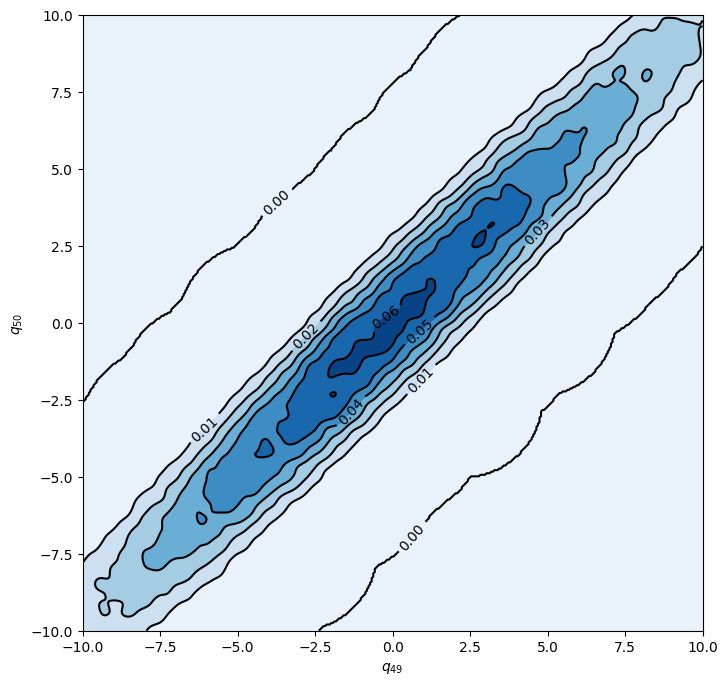

In [14]:
xmin, xmax = -10, 10
ymin, ymax = -10, 10

xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Contourf plot
cfset = ax.contourf(xx, yy, loss_pdf_empirical2D._target.cpu(), cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot

# Contour plot
cset = ax.contour(xx, yy, loss_pdf_empirical2D._target.cpu(), colors='k')
# Label plot
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel(r'$q_{49}$')
ax.set_ylabel(r'$q_{50}$')

plt.show()

Text(0.5, 1.0, 'target empirical PDF')

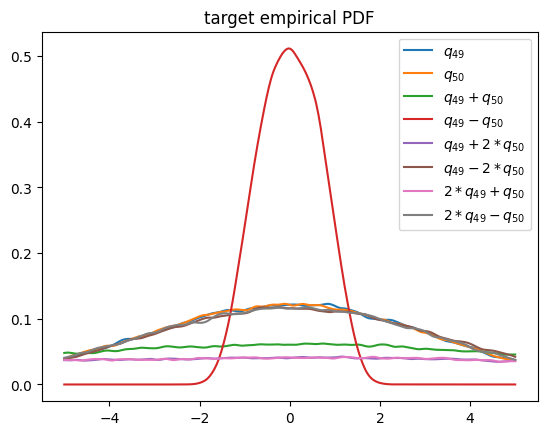

In [15]:
x_grid=-np.linspace(-5,5,num=sec_length)
# x_grid=-np.linspace(-5,5,num=sec_length)
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,0],label=r'$q_{49}$')
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,1],label=r'$q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,0],label=r'$q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,1],label=r'$q_{49}-q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,2],label=r'$q_{49}+2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,3],label=r'$q_{49}-2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,4],label=r'$2*q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,5],label=r'$2*q_{49}-q_{50}$')
plt.legend()
plt.title('target empirical PDF')

In [45]:
class Model:
    def __init__(self, net):

        self.x_acf_s = None
        self.x_ccf_s = None
        self.x_pdf_s = None
        self.x_pdf2_s = None
        self.x_acf2_s = None
        self.s_collect = []

        self.net = net

        self.T_error=[]
        self.V_error=[]
        self.T_ccf=[]
        self.V_ccf=[]
        self.T_pdf=[]
        self.V_pdf=[]
        self.T_pdf2=[]
        self.V_pdf2=[]
        self.T_acf=[]
        self.V_acf=[]
        self.T_acf2=[]
        self.V_acf2=[]
        self.Step=[]
        self.iter = 0
        self.time = 0

    def train_U(self, x):
        return self.net(x)

    def predict_U(self, x):
        return self.train_U(x)

    def likelihood_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        loss = torch.reciprocal(2. * self.x_acf_s ** 2) * loss_acf.detach()      \
               + torch.reciprocal(2. * self.x_ccf_s ** 2) * loss_ccf.detach()    \
               + torch.reciprocal(2. * self.x_pdf_s ** 2) * loss_pdf.detach()    \
               + torch.reciprocal(2. * self.x_pdf2_s ** 2) * loss_pdf2.detach()  \
               + torch.reciprocal(2. * self.x_acf2_s ** 2) * loss_acf2.detach()  \
               + torch.log(self.x_acf_s * self.x_ccf_s * self.x_pdf_s * self.x_pdf2_s * self.x_acf2_s)
        return loss

    def true_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        return torch.reciprocal(2. * self.x_acf_s.detach() ** 2) * loss_acf + torch.reciprocal(2. * self.x_ccf_s.detach() ** 2) * loss_ccf + torch.reciprocal(2. * self.x_pdf_s.detach() ** 2) * loss_pdf + torch.reciprocal(2. * self.x_pdf2_s.detach() ** 2) * loss_pdf2 + torch.reciprocal(2. * self.x_acf2_s.detach() ** 2) * loss_acf2


    def run_baseline(self):
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        for step in range(20000):
            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val)+ loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break

        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')



    def run_AW(self):
        self.x_acf_s = nn.Parameter(self.x_acf_s, requires_grad=True)
        self.x_ccf_s = nn.Parameter(self.x_ccf_s, requires_grad=True)
        self.x_pdf_s = nn.Parameter(self.x_pdf_s, requires_grad=True)
        self.x_pdf2_s = nn.Parameter(self.x_pdf2_s, requires_grad=True)
        self.x_acf2_s = nn.Parameter(self.x_acf2_s, requires_grad=True)

        # Rectifying ADAM optimizer
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        optimizer_adam_weight = optim.Adam([self.x_acf_s] + [self.x_ccf_s] + [self.x_pdf_s] + [self.x_pdf2_s] + [self.x_acf2_s],
                                                     lr=1e-3)
        # Use cosine annealing for learning rate.
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_adam, 20000)
        scheduler_weight = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_adam_weight, 20000)

        for step in range(20000):
            self.s_collect.append([self.iter, self.x_acf_s.item(), self.x_ccf_s.item(), self.x_pdf_s.item(), self.x_pdf2_s.item(), self.x_acf2_s.item()])

            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            scheduler.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val) + loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break
            optimizer_adam_weight.zero_grad()
            loss = self.likelihood_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam_weight.step()
            scheduler_weight.step()
        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')


    def train(self):
        self.x_acf_s = torch.tensor(2.).float()
        self.x_ccf_s = torch.tensor(2.).float()
        self.x_pdf_s = torch.tensor(1.).float()
        self.x_pdf2_s = torch.tensor(1.).float()
        self.x_acf2_s = torch.tensor(1.).float()
        start_time = time.time()
        if model_type == 0:
            self.run_baseline()
        elif model_type == 1:
            self.run_AW()
        elapsed = time.time() - start_time
        self.time = elapsed
        print('Training time: %.2f' % elapsed)
        avg_time = elapsed/self.iter
        print('Training time per iteration: %.2f' % avg_time)
        print('Number of Iterations:%d' %self.iter)

In [17]:
### Defining SINN model
net = SINN(2, 100, 5, 2).to(device) # input dimension, hidden size, number of layers, output dimension

In [18]:
model = Model(net=net)

In [19]:
model_type = 1

In [20]:
model.train()

[0]-th step loss: 0.8579, 0.8126, acf: 0.09445, ccf: 0.09615, pdf: 0.29322, pdf2: 0.28987, acf2: 0.03890
[50]-th step loss: 0.0962, 0.0690, acf: 0.01969, ccf: 0.01965, pdf: 0.01387, pdf2: 0.01172, acf2: 0.00403
[100]-th step loss: 0.0590, 0.0552, acf: 0.01827, ccf: 0.01824, pdf: 0.00623, pdf2: 0.00858, acf2: 0.00388
[150]-th step loss: 0.0389, 0.0187, acf: 0.00575, ccf: 0.00574, pdf: 0.00220, pdf2: 0.00308, acf2: 0.00194
[200]-th step loss: 0.0211, 0.0337, acf: 0.00771, ccf: 0.00767, pdf: 0.00582, pdf2: 0.00913, acf2: 0.00340
[250]-th step loss: 0.0097, 0.0110, acf: 0.00102, ccf: 0.00102, pdf: 0.00331, pdf2: 0.00296, acf2: 0.00267
[300]-th step loss: 0.0179, 0.0161, acf: 0.00279, ccf: 0.00277, pdf: 0.00227, pdf2: 0.00262, acf2: 0.00565
[350]-th step loss: 0.0215, 0.0206, acf: 0.00416, ccf: 0.00413, pdf: 0.00204, pdf2: 0.00220, acf2: 0.00811
[400]-th step loss: 0.0084, 0.0081, acf: 0.00080, ccf: 0.00080, pdf: 0.00248, pdf2: 0.00284, acf2: 0.00122
[450]-th step loss: 0.0048, 0.0423, acf:

In [21]:
def draw_loss(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot",fontsize=15) 
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'r',label='Training error')
    plt.plot(model.Step, model.V_error,'b--',label='Validation error')
#     plt.loglog(model.Step, model.T_error,'r',label='Training error')
#     plt.loglog(model.Step, model.V_error,'b--',label='Validation error')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)

In [22]:
def draw_errors(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot for loss functions w/o coeff",fontsize=15)
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'k',label='Training error')
    plt.plot(model.Step, model.V_error,'k--')
    plt.plot(model.Step, model.T_acf,'r',label='acf error')
    plt.plot(model.Step, model.V_acf,'r--')
    plt.plot(model.Step, model.T_ccf,'b',label='ccf error')
    plt.plot(model.Step, model.V_ccf,'b--')
    plt.plot(model.Step, model.T_pdf,'y',label='pdf error')
    plt.plot(model.Step, model.V_pdf,'y--')
    plt.plot(model.Step, model.T_pdf2,'m',label='pdf2 error')
    plt.plot(model.Step, model.V_pdf2,'m--')
    plt.plot(model.Step, model.T_acf2,'g',label='acf2 error')
    plt.plot(model.Step, model.V_acf2,'g--')
    
#     plt.loglog(model.Step, model.T_error,'k',label='Training error')
#     plt.loglog(model.Step, model.V_error,'k--')
#     plt.loglog(model.Step, model.T_acf,'r',label='acf error')
#     plt.loglog(model.Step, model.V_acf,'r--')
#     plt.loglog(model.Step, model.T_ccf,'b',label='ccf error')
#     plt.loglog(model.Step, model.V_ccf,'b--')
#     plt.loglog(model.Step, model.T_pdf,'y',label='pdf error')
#     plt.loglog(model.Step, model.V_pdf,'y--')
#     plt.loglog(model.Step, model.T_pdf2,'m',label='pdf2 error')
#     plt.loglog(model.Step, model.V_pdf2,'m--')
#     plt.loglog(model.Step, model.T_acf2,'g',label='acf2 error')
#     plt.loglog(model.Step, model.V_acf2,'g--')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15, bbox_to_anchor=(1.1, 1.05))

In [23]:
def draw_adaptive_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
#     plt.yscale('log')
    plt.plot(s_collect[:, 0], s_collect[:, 1], 'r-', label=r'$\epsilon_{acf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 2], 'b-', label='$\epsilon_{ccf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 3], 'y-', label='$\epsilon_{pdf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 4], 'm-', label='$\epsilon_{pdf2}$')
    plt.plot(s_collect[:, 0], s_collect[:, 5], 'g-', label='$\epsilon_{acf2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$s$')
#     plt.xscale('log')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

In [24]:
def draw_epoch_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
    plt.yscale('log')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 1]**2), 'r-', label=r'$\frac{1}{2\epsilon_{acf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 2]**2), 'b-', label=r'$\frac{1}{2\epsilon_{ccf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 3]**2), 'y-', label=r'$\frac{1}{2\epsilon_{pdf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 4]**2), 'm-', label=r'$\frac{1}{2\epsilon_{pdf2}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 5]**2), 'g-', label=r'$\frac{1}{2\epsilon_{acf2}^2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$\omega$')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

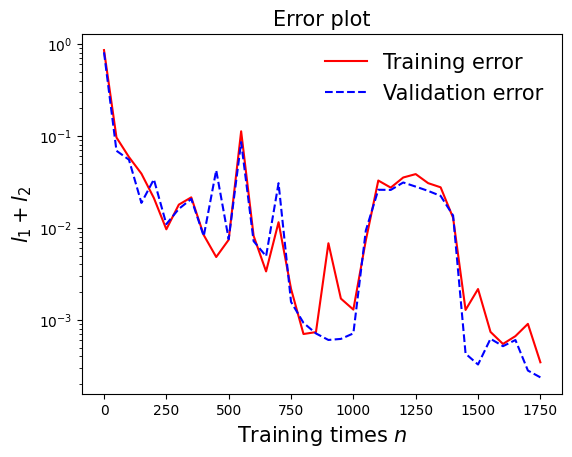

In [25]:
draw_loss(model)

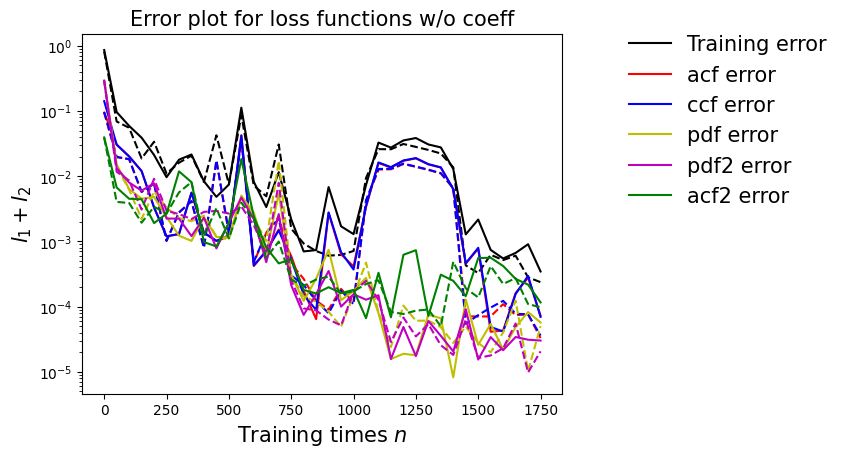

In [26]:
draw_errors(model)

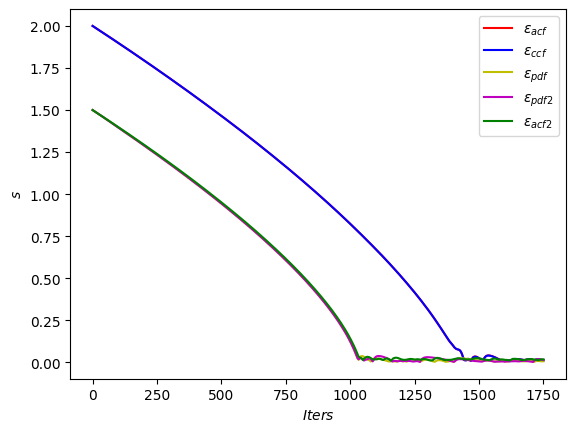

In [27]:
draw_adaptive_w(model)

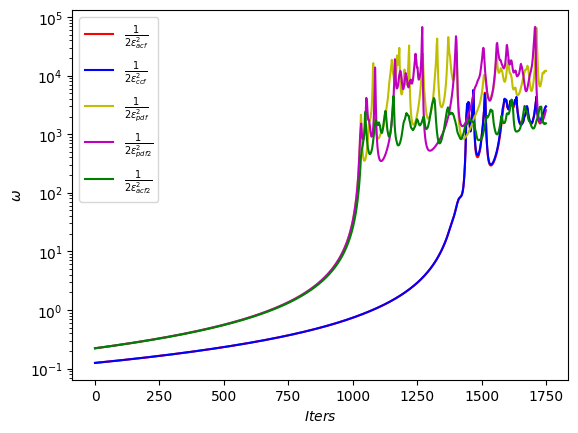

In [28]:
draw_epoch_w(model)

## Test 1: plot the sample path generated by SINN and the exact sample path 

In [29]:
def test1(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    # Test 1: plot the sample path generated by SINN and the exact sample path 
    skip = 0

    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.plot(T[skip:]-T[skip], Traj[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$\tilde{q}_1(t)$ and $\tilde{q}_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.plot(T[skip:]-T[skip], prediction[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_1(t)$ and $q_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF

In [30]:
def test2(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF  
    acf_p=StatLoss.acf(Pred[-sec_length:,:,:])
    acf_t=StatLoss.acf(target)
    corr_p1=acf_p.detach().cpu().numpy()
    corr_t1=acf_t.detach().cpu().numpy()
    ccf_p=StatLoss.ccf(Pred[-sec_length:,:,:])
    ccf_t=StatLoss.ccf(target)
    corr_p2=ccf_p.detach().cpu().numpy()
    corr_t2=ccf_t.detach().cpu().numpy()
    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_1$',fontsize=15)    
    plt.plot(T, corr_t1[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_2$',fontsize=15)          
    plt.plot(T, corr_t1[...,-1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,-1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized CCF',fontsize=15)    
    plt.plot(T, corr_t2[:,:],'r')        # correlation function of the target 
    plt.plot(T, corr_p2[:,:], 'b--')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.ylim(-0.05,0.05)

## Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  

In [31]:
def test3(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  
    rho_data =  StatLoss.gauss_kde(target, -5, 5, 400, None).cpu()
    rho_input = StatLoss.gauss_kde(ran_input, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    rho_data2 =  StatLoss.gauss_kde6(target, -5, 5, 400, None).cpu()
    rho_prediction2 = StatLoss.gauss_kde6(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()


    x=np.linspace(-5, 5, 400)
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function",fontsize=15)    
    plt.plot(x, rho_data.numpy()[...,0],label=r'Exact PDF of $q_{49}$')    # target PDF
    plt.plot(x, rho_data.numpy()[...,1],label=r'Exact PDF of $q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction.numpy()[...,0], ':',label=r'PDF of the output $q_{49}$')  # PDF after the training 
    plt.plot(x, rho_prediction.numpy()[...,1], ':',label=r'PDF of the output $q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,0],label=r'Exact PDF of $q_{49}+q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,1],label=r'Exact PDF of $q_{49}-q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,0], ':',label=r'PDF of the output $q_{49}+q_{50}$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,1], ':',label=r'PDF of the output $q_{49}-q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,2],label=r'Exact PDF of $q_{49}+2q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,3],label=r'Exact PDF of $q_{49}-2q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,2], ':',label=r'PDF of the output $q_{49}+2\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,3], ':',label=r'PDF of the output $q_{49}-2\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(3)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,4],label=r'Exact PDF of $2q_{49}+\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,5],label=r'Exact PDF of $2q_{49}-\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,4], ':',label=r'PDF of the output $2q_{49}+\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,5], ':',label=r'PDF of the output $2q_{49}-\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 4: Comparing the higher-order ACF

In [32]:
def test4(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    # Test 4: Comparing the higher-order ACF
    acf2=StatLoss.acf(target**2)
    pred_norm=torch.from_numpy((prediction).reshape(sec_length, batch,2))
    acf2_app=StatLoss.acf(pred_norm**2)

    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{49}^2$',fontsize=15)    
    plt.plot(T, acf2.detach().cpu().numpy()[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{50}^2$',fontsize=15)          
    plt.plot(T, acf2.detach().cpu().numpy()[...,1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()    

## Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 

In [33]:
def test5(model):
    # Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 
    [a,b,c]=input.size()
    skip=20
    scale=10
    burnin=3
    fold=800
    batch_new=50
    ran_input=torch.randn(((scale-burnin)*a,batch_new,c),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred_L, _= model.predict_U(ran_input)
    prediction_ext=Pred_L.detach().cpu().numpy().reshape((scale-burnin)*a, batch_new,2)
    ccf_p=StatLoss.ccf(Pred_L,method='bruteforce')

    LT=np.linspace(0,(scale-burnin)*a*delta_t,num=(scale-burnin)*a+1)
    LT=LT[0:-1]


    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

## Test 6: comparing scatter plots

In [34]:
def test6(model):
    # Test 6: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.scatter(Traj[:,:,0], Traj[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.scatter(prediction[:,:,0],prediction[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 7: comparing joint PDF contours

In [35]:
def test7(model):
    # Test 5: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    rho_data =  StatLoss.gauss_kde2D(target, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde2D(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    fig = plt.figure(0, figsize=(5, 5))
    plt.title("PDF Contours",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

    xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
    axs[0]  = fig.gca()
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    
    plt.contour(xx,yy,rho_data.numpy(),colors='r')
    plt.contour(xx,yy,rho_prediction.numpy(),colors='b',linestyles='dashed')

    plt.xlabel(r'$q_{49}$')
    plt.ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(1,figsize=(5, 5))
    plt.title("MD trajectories",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_data.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_data.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(2,figsize=(5, 5))
    plt.title("SINN output",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_prediction.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_prediction.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

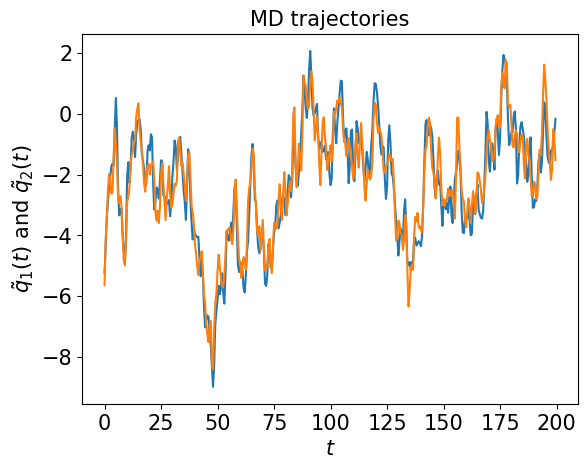

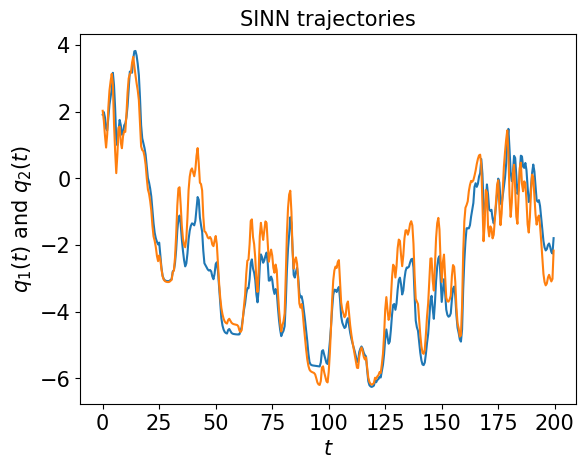

In [36]:
test1(model)

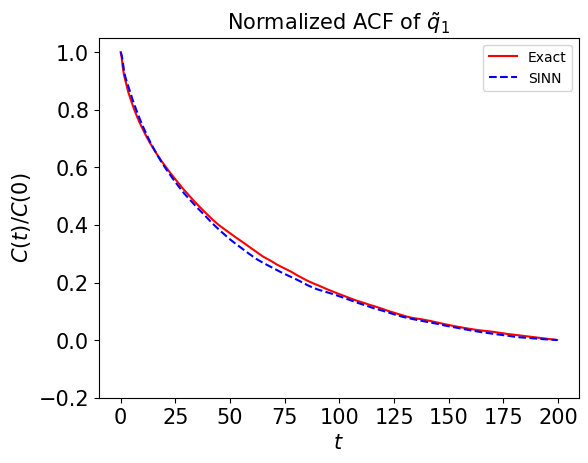

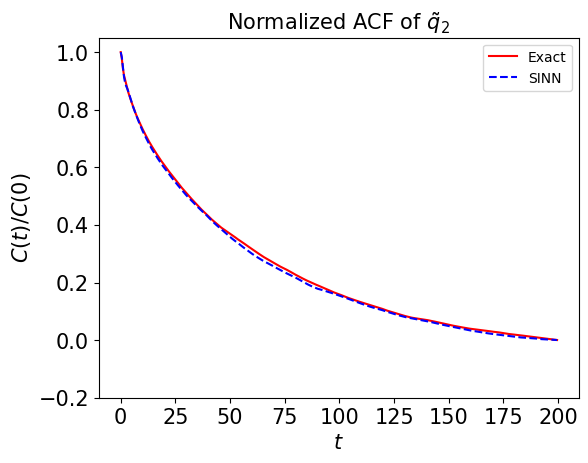

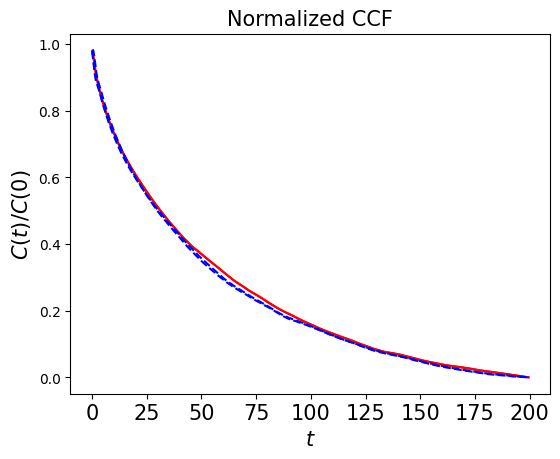

In [37]:
test2(model)

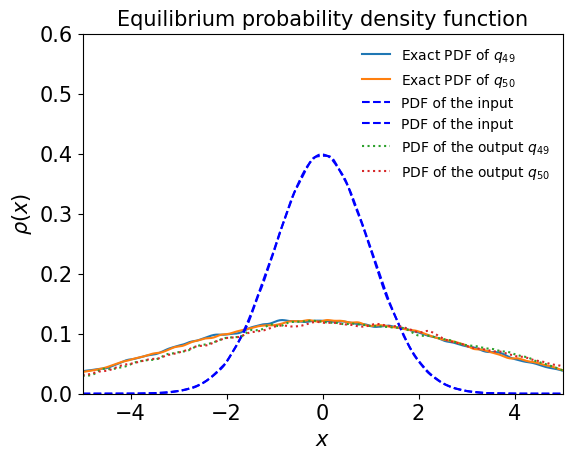

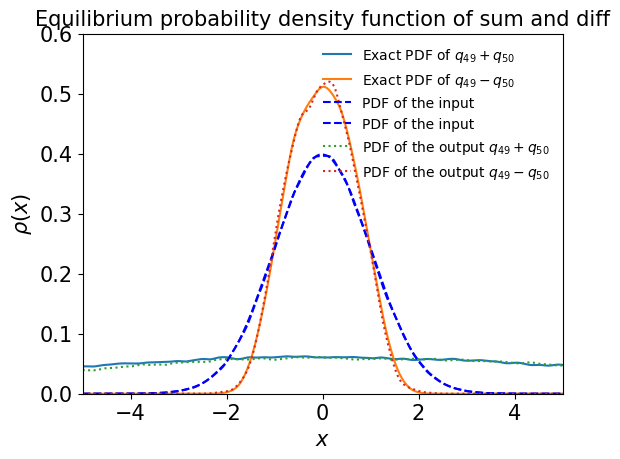

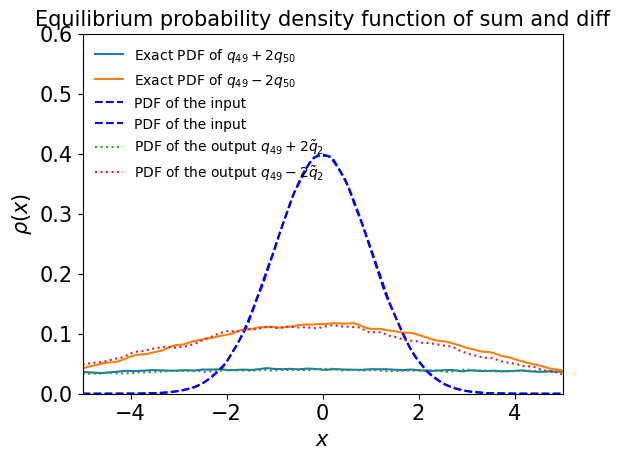

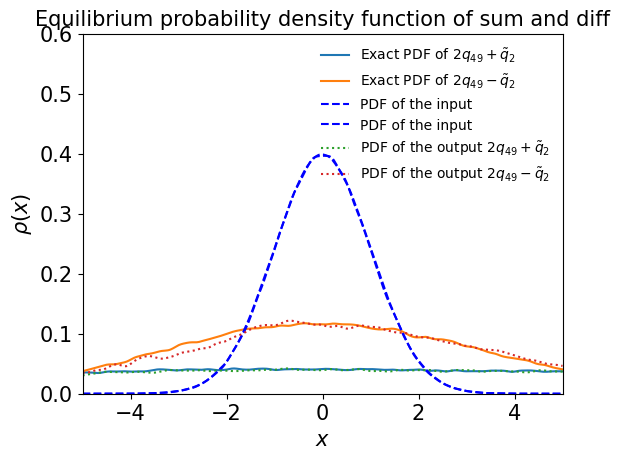

In [38]:
test3(model)

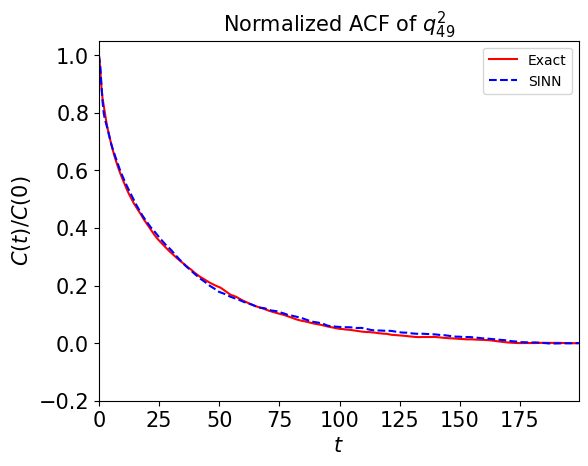

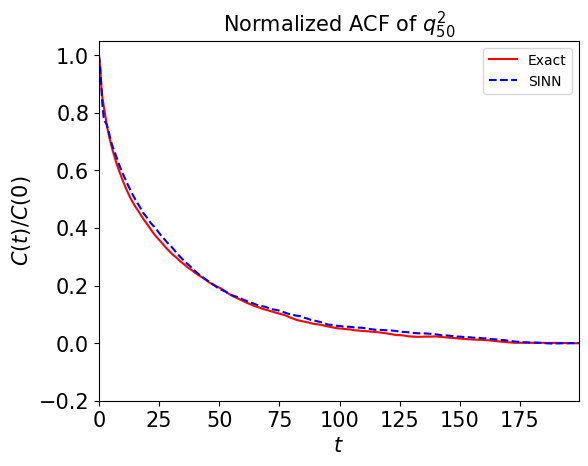

In [39]:
test4(model)

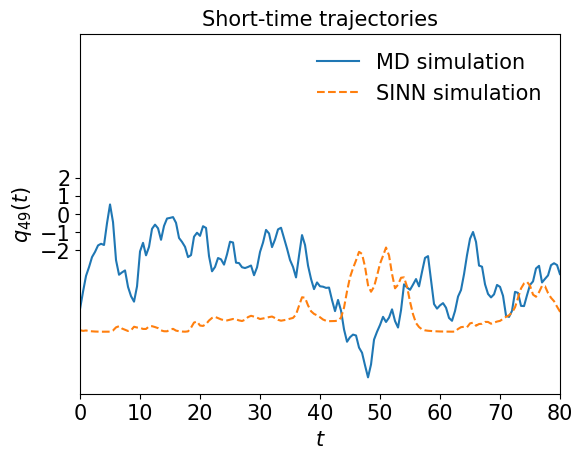

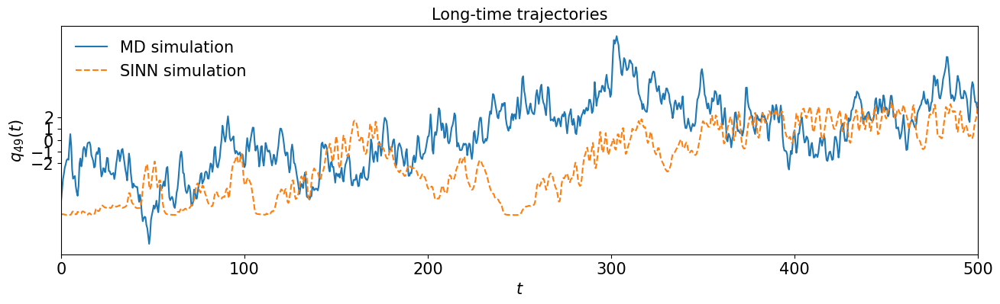

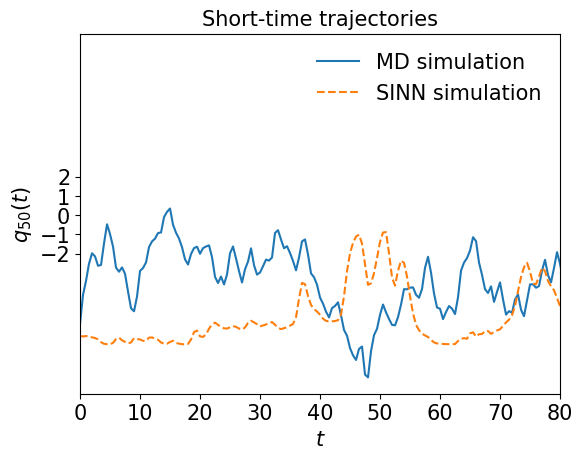

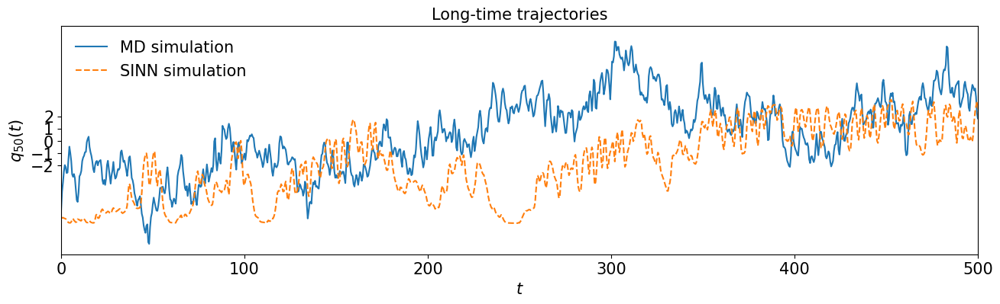

In [40]:
test5(model)

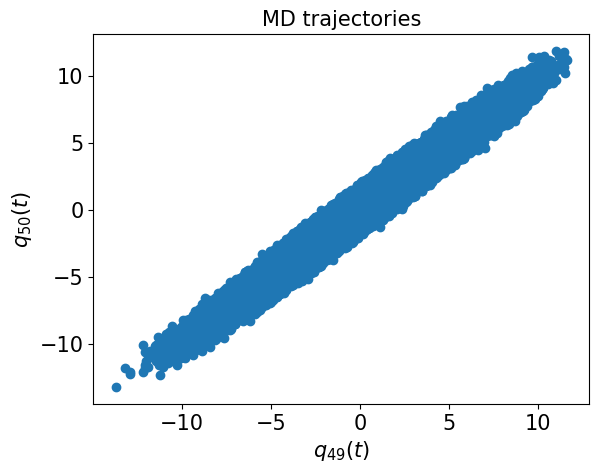

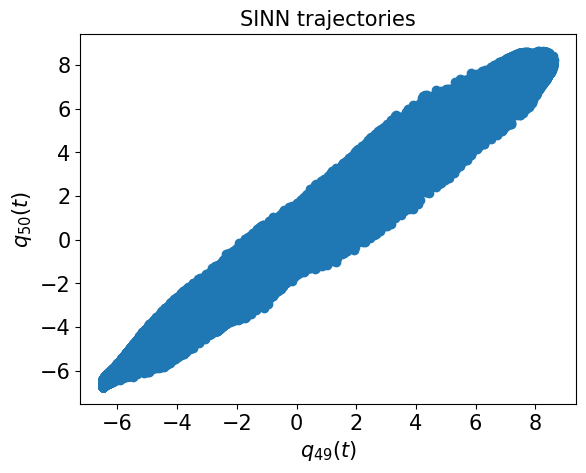

In [41]:
test6(model)

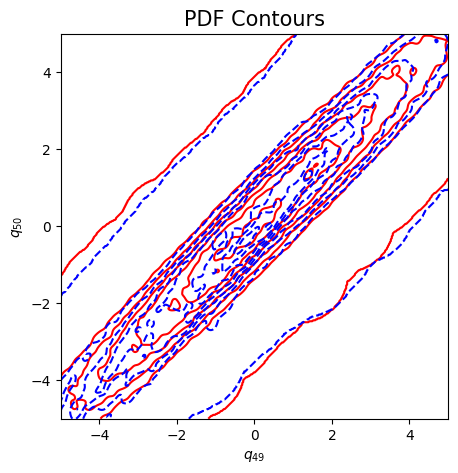

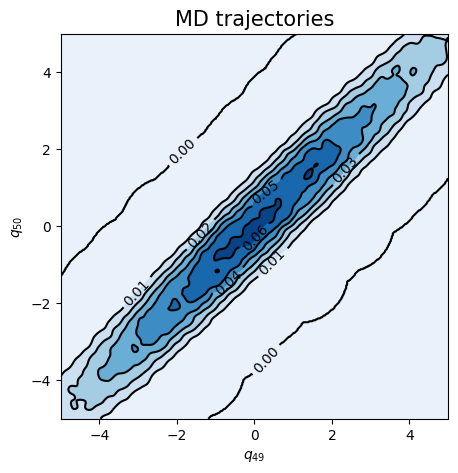

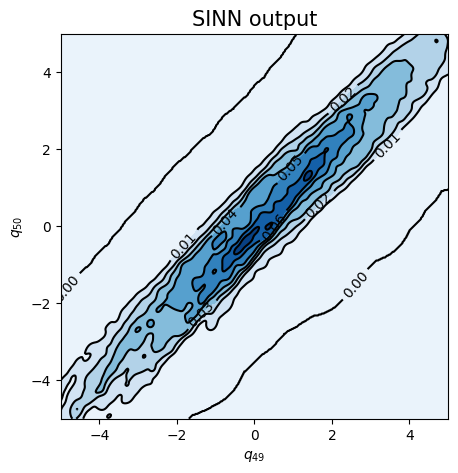

In [42]:
test7(model)

In [46]:
### Defining SINN model
net1 = SINN(2, 100, 5, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model1 = Model(net=net1)
model1.train()

[0]-th step loss: 0.8655, 0.8201, acf: 0.09451, ccf: 0.10355, pdf: 0.29320, pdf2: 0.28991, acf2: 0.03898
[50]-th step loss: 0.0972, 0.0739, acf: 0.02490, ccf: 0.02485, pdf: 0.01149, pdf2: 0.00805, acf2: 0.00461
[100]-th step loss: 0.1212, 0.0953, acf: 0.03948, ccf: 0.03940, pdf: 0.00348, pdf2: 0.00345, acf2: 0.00948
[150]-th step loss: 0.0131, 0.0107, acf: 0.00253, ccf: 0.00252, pdf: 0.00166, pdf2: 0.00238, acf2: 0.00162
[200]-th step loss: 0.1335, 0.1268, acf: 0.04966, ccf: 0.04955, pdf: 0.00807, pdf2: 0.00889, acf2: 0.01066
[250]-th step loss: 0.0113, 0.0097, acf: 0.00237, ccf: 0.00239, pdf: 0.00096, pdf2: 0.00151, acf2: 0.00243
[300]-th step loss: 0.0225, 0.0301, acf: 0.00825, ccf: 0.00823, pdf: 0.00365, pdf2: 0.00801, acf2: 0.00199
[350]-th step loss: 0.0065, 0.0123, acf: 0.00404, ccf: 0.00402, pdf: 0.00073, pdf2: 0.00179, acf2: 0.00172
[400]-th step loss: 0.0765, 0.0509, acf: 0.02068, ccf: 0.02063, pdf: 0.00229, pdf2: 0.00429, acf2: 0.00298
[450]-th step loss: 0.0079, 0.0068, acf:

[3850]-th step loss: 0.2823, 0.2823, acf: 0.11541, ccf: 0.11512, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05173
[3900]-th step loss: 0.2828, 0.2829, acf: 0.11562, ccf: 0.11533, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05195
[3950]-th step loss: 0.2832, 0.2835, acf: 0.11594, ccf: 0.11565, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05188
[4000]-th step loss: 0.2838, 0.2839, acf: 0.11612, ccf: 0.11582, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05198
[4050]-th step loss: 0.2841, 0.2843, acf: 0.11618, ccf: 0.11588, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05221
[4100]-th step loss: 0.2837, 0.2839, acf: 0.11603, ccf: 0.11573, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05218
[4150]-th step loss: 0.2840, 0.2837, acf: 0.11602, ccf: 0.11573, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05196
[4200]-th step loss: 0.2836, 0.2836, acf: 0.11617, ccf: 0.11587, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05151
[4250]-th step loss: 0.2833, 0.2832, acf: 0.11603, ccf: 0.11574, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05143
[4300]-th step loss: 0.2827,

[7650]-th step loss: 0.2810, 0.2810, acf: 0.11475, ccf: 0.11444, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05184
[7700]-th step loss: 0.2811, 0.2810, acf: 0.11485, ccf: 0.11454, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05160
[7750]-th step loss: 0.2813, 0.2813, acf: 0.11490, ccf: 0.11460, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05184
[7800]-th step loss: 0.2817, 0.2815, acf: 0.11488, ccf: 0.11458, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05205
[7850]-th step loss: 0.2818, 0.2818, acf: 0.11506, ccf: 0.11476, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05198
[7900]-th step loss: 0.2821, 0.2819, acf: 0.11495, ccf: 0.11464, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05231
[7950]-th step loss: 0.2819, 0.2819, acf: 0.11502, ccf: 0.11471, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05215
[8000]-th step loss: 0.2814, 0.2812, acf: 0.11487, ccf: 0.11455, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05173
[8050]-th step loss: 0.2819, 0.2816, acf: 0.11517, ccf: 0.11485, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05159
[8100]-th step loss: 0.2816,

[11450]-th step loss: 0.2802, 0.2801, acf: 0.11351, ccf: 0.11317, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05341
[11500]-th step loss: 0.2802, 0.2802, acf: 0.11353, ccf: 0.11319, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05347
[11550]-th step loss: 0.2804, 0.2803, acf: 0.11354, ccf: 0.11319, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05357
[11600]-th step loss: 0.2805, 0.2805, acf: 0.11362, ccf: 0.11327, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05363
[11650]-th step loss: 0.2805, 0.2805, acf: 0.11365, ccf: 0.11330, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05358
[11700]-th step loss: 0.2806, 0.2808, acf: 0.11375, ccf: 0.11341, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05359
[11750]-th step loss: 0.2804, 0.2804, acf: 0.11368, ccf: 0.11333, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05343
[11800]-th step loss: 0.2803, 0.2803, acf: 0.11360, ccf: 0.11326, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05342
[11850]-th step loss: 0.2799, 0.2801, acf: 0.11351, ccf: 0.11316, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05342
[11900]-th step los

[15250]-th step loss: 0.2805, 0.2806, acf: 0.11384, ccf: 0.11351, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05323
[15300]-th step loss: 0.2806, 0.2806, acf: 0.11384, ccf: 0.11350, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05325
[15350]-th step loss: 0.2805, 0.2805, acf: 0.11380, ccf: 0.11347, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05324
[15400]-th step loss: 0.2808, 0.2806, acf: 0.11386, ccf: 0.11353, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05323
[15450]-th step loss: 0.2804, 0.2806, acf: 0.11383, ccf: 0.11350, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05323
[15500]-th step loss: 0.2805, 0.2805, acf: 0.11381, ccf: 0.11347, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05325
[15550]-th step loss: 0.2805, 0.2806, acf: 0.11380, ccf: 0.11347, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05328
[15600]-th step loss: 0.2809, 0.2807, acf: 0.11385, ccf: 0.11351, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05330
[15650]-th step loss: 0.2806, 0.2807, acf: 0.11387, ccf: 0.11354, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05325
[15700]-th step los

[19050]-th step loss: 0.2802, 0.2803, acf: 0.11373, ccf: 0.11340, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05314
[19100]-th step loss: 0.2806, 0.2803, acf: 0.11372, ccf: 0.11340, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05314
[19150]-th step loss: 0.2802, 0.2803, acf: 0.11373, ccf: 0.11340, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05314
[19200]-th step loss: 0.2803, 0.2803, acf: 0.11373, ccf: 0.11340, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05314
[19250]-th step loss: 0.2804, 0.2803, acf: 0.11373, ccf: 0.11340, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05314
[19300]-th step loss: 0.2802, 0.2803, acf: 0.11373, ccf: 0.11340, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05314
[19350]-th step loss: 0.2803, 0.2803, acf: 0.11373, ccf: 0.11340, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05314
[19400]-th step loss: 0.2806, 0.2803, acf: 0.11373, ccf: 0.11340, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05314
[19450]-th step loss: 0.2805, 0.2803, acf: 0.11373, ccf: 0.11340, pdf: 0.00000, pdf2: 0.00000, acf2: 0.05314
[19500]-th step los

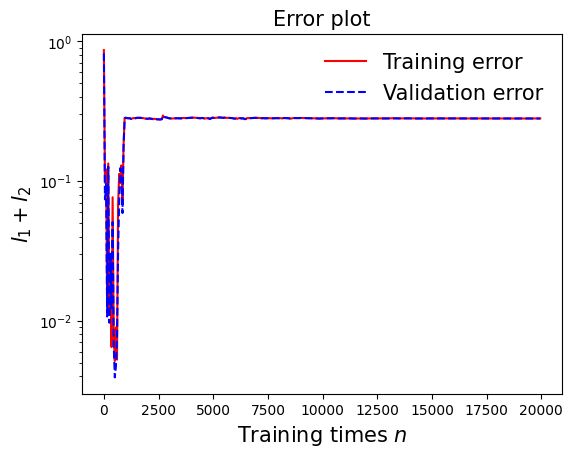

In [47]:
draw_loss(model1)

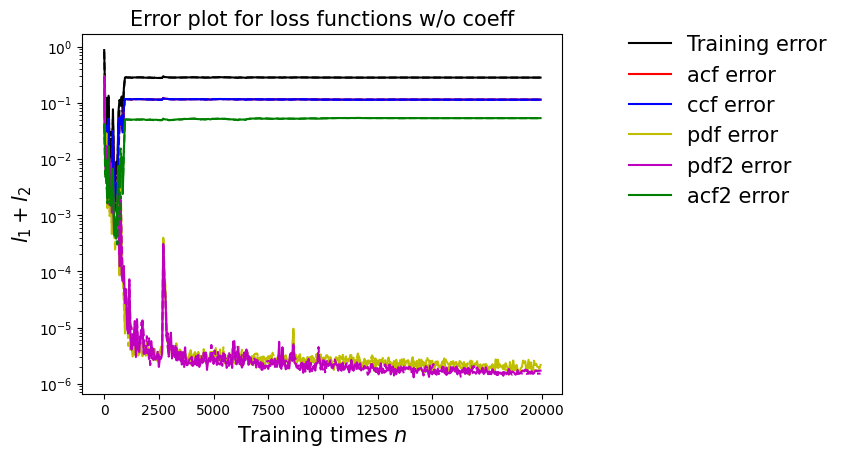

In [48]:
draw_errors(model1)

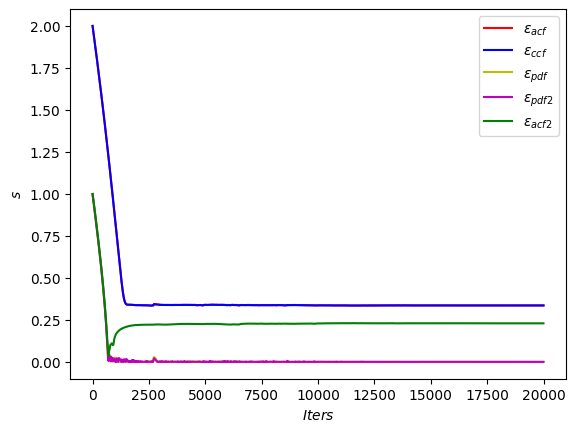

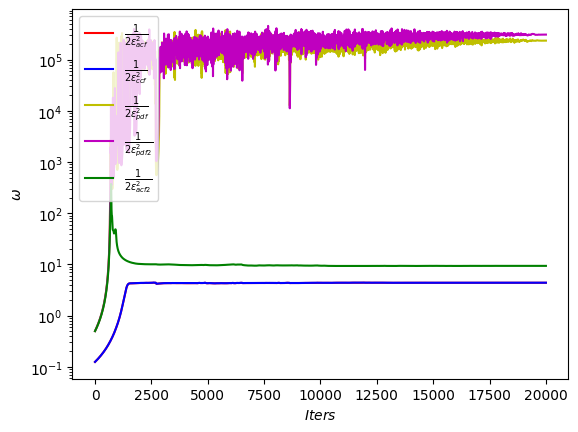

In [49]:
draw_adaptive_w(model1)
draw_epoch_w(model1)

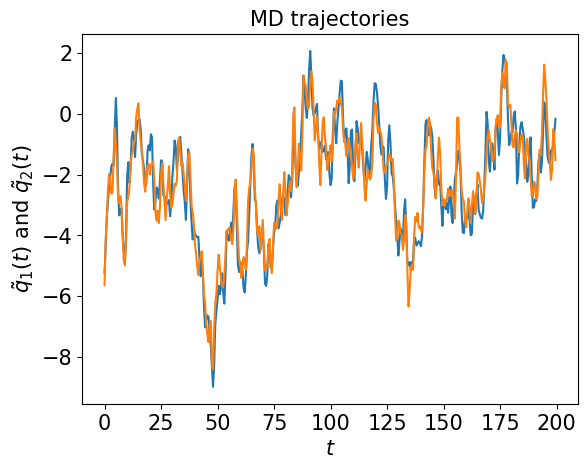

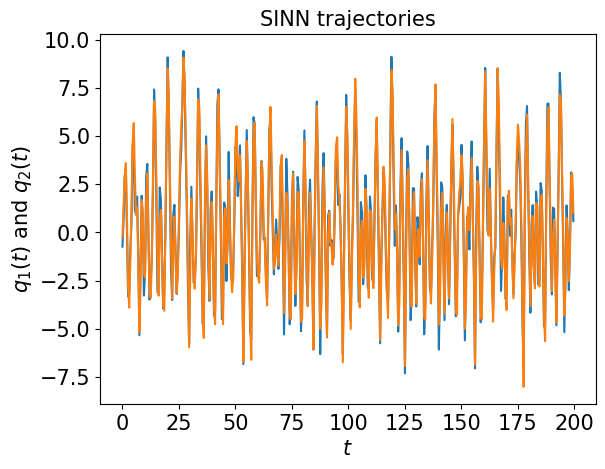

In [50]:
test1(model1)

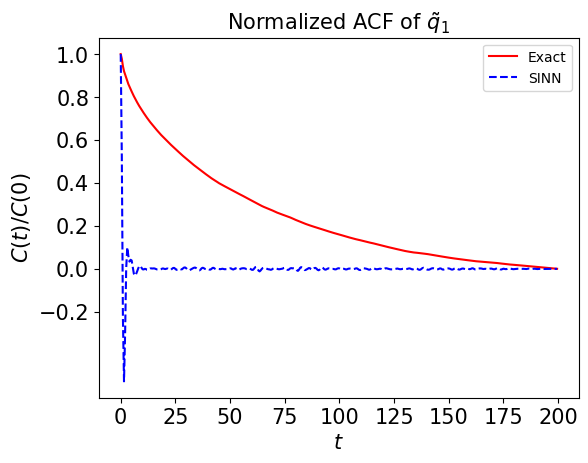

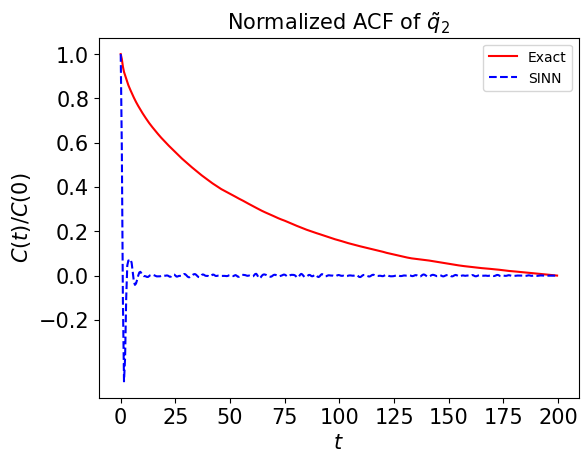

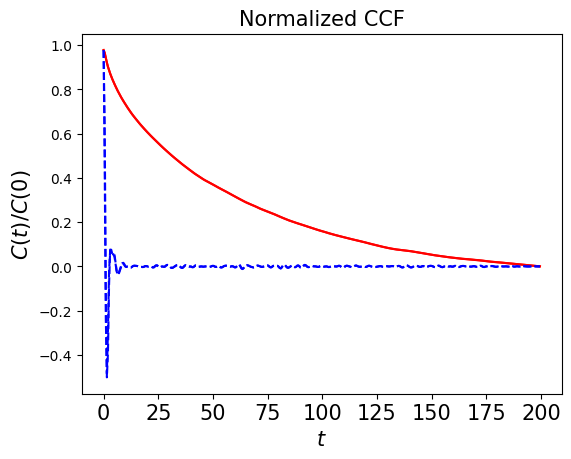

In [51]:
test2(model1)

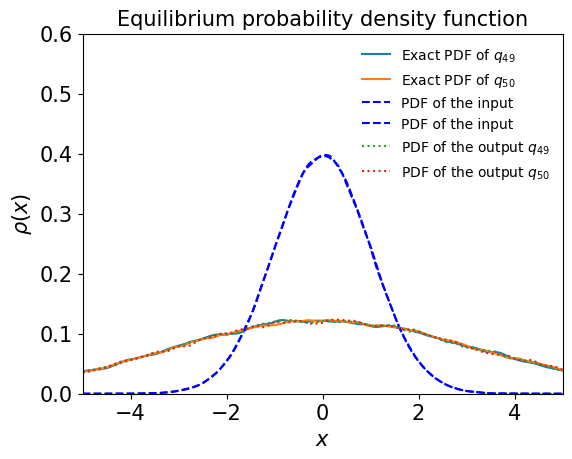

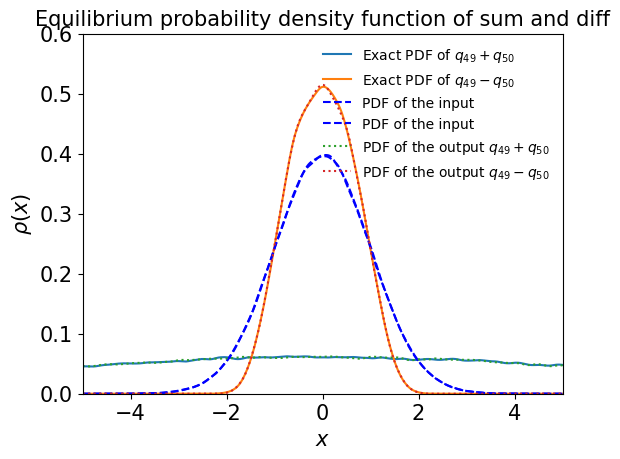

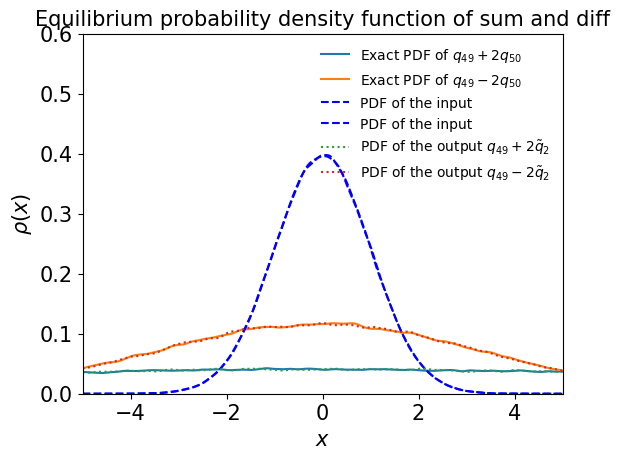

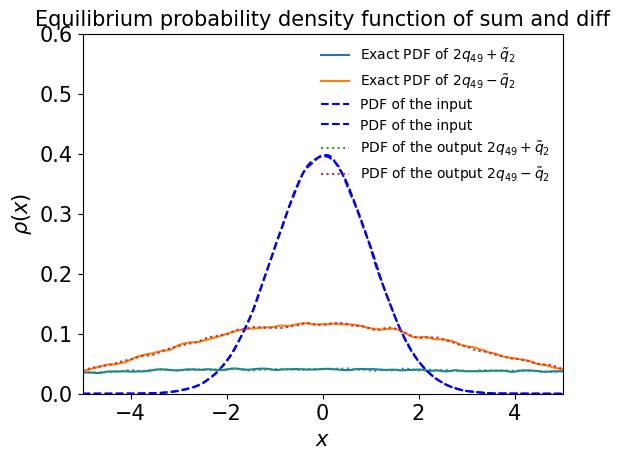

In [52]:
test3(model1)

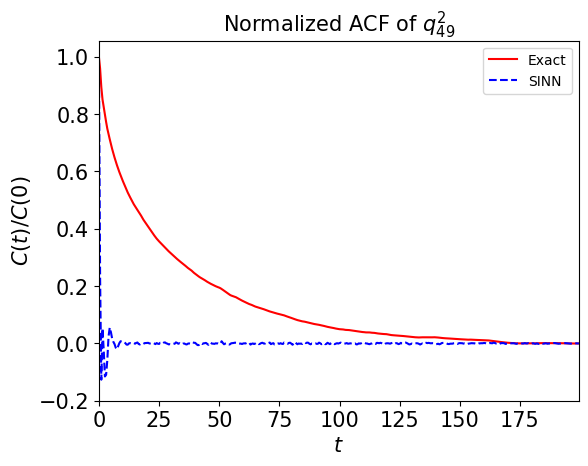

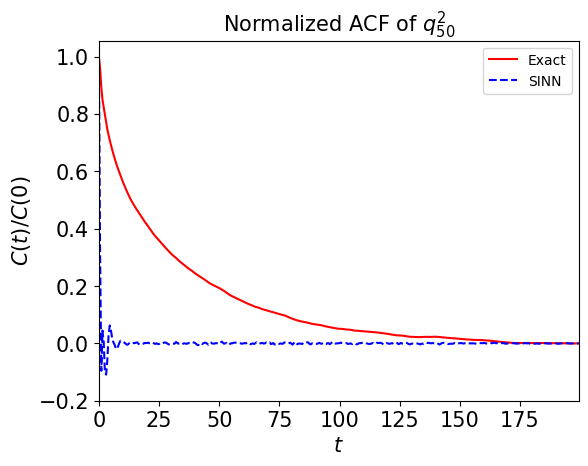

In [53]:
test4(model1)

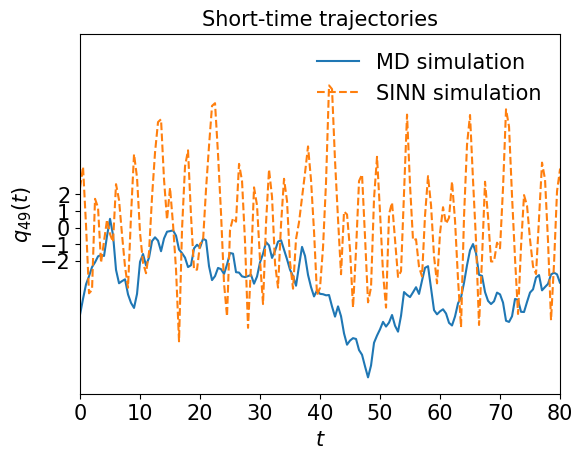

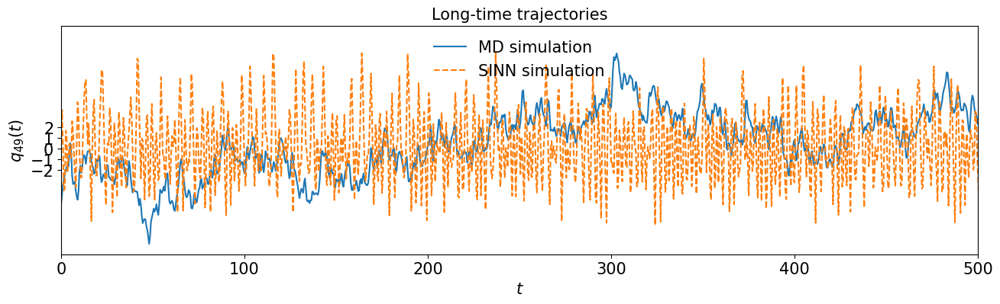

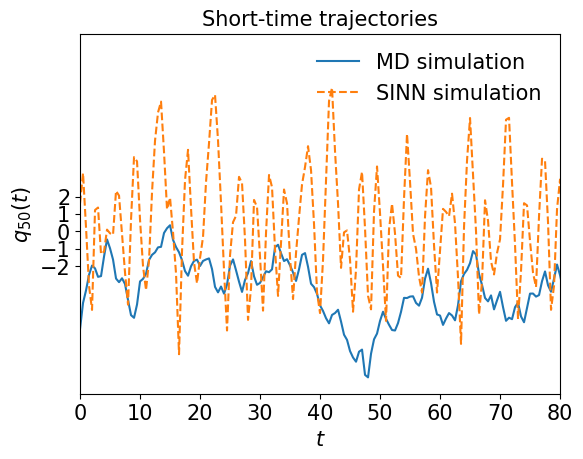

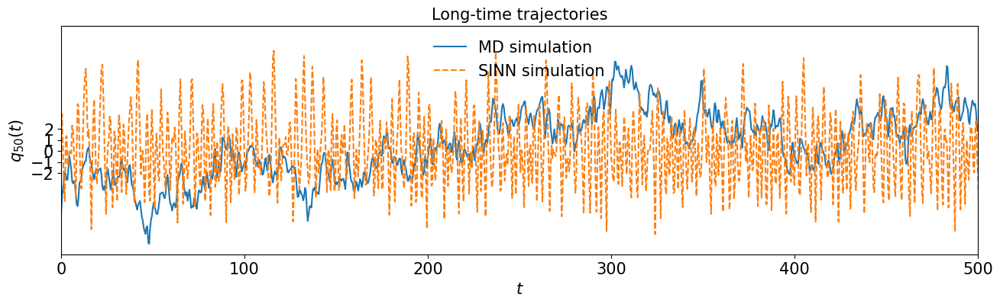

In [54]:
test5(model1)

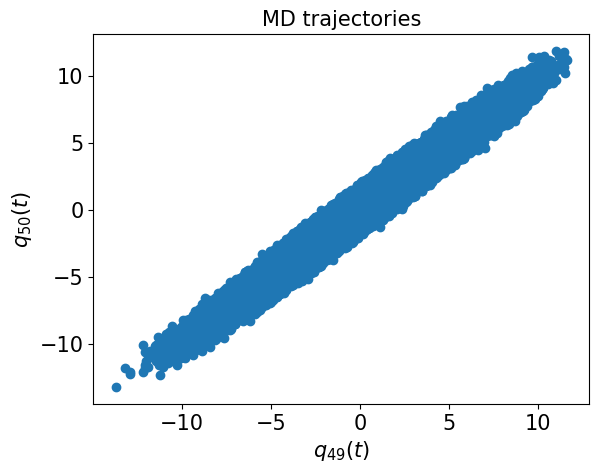

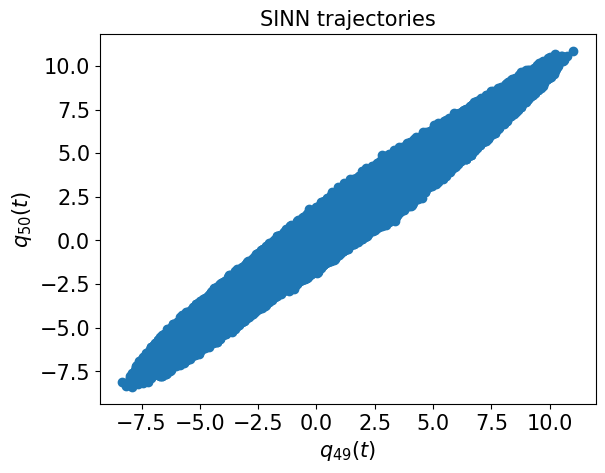

In [55]:
test6(model1)

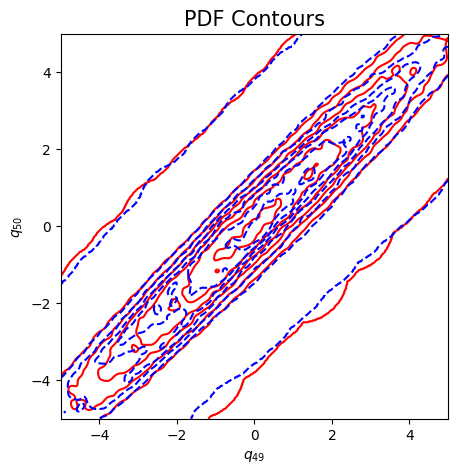

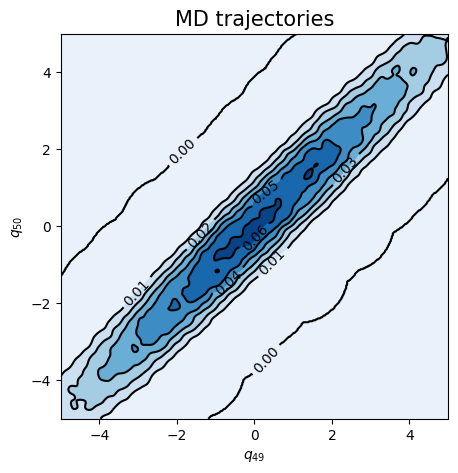

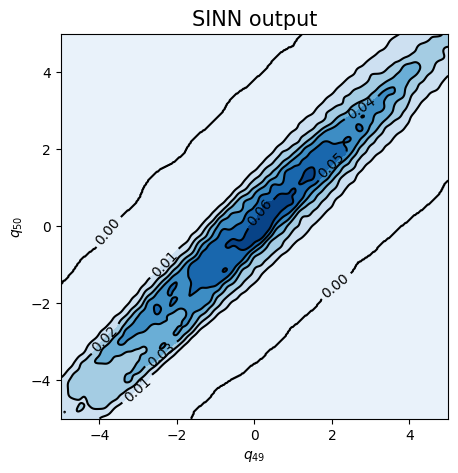

In [56]:
test7(model1)

In [57]:
### Defining SINN model
net2 = SINN(2, 100, 5, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model2 = Model(net=net2)
model2.train()

[0]-th step loss: 0.8374, 0.8418, acf: 0.09573, ccf: 0.12306, pdf: 0.29322, pdf2: 0.28989, acf2: 0.03993
[50]-th step loss: 0.1417, 0.1427, acf: 0.05587, ccf: 0.05577, pdf: 0.00479, pdf2: 0.00481, acf2: 0.02151
[100]-th step loss: 0.0576, 0.0598, acf: 0.02654, ccf: 0.02649, pdf: 0.00172, pdf2: 0.00183, acf2: 0.00322
[150]-th step loss: 0.0457, 0.0398, acf: 0.01407, ccf: 0.01405, pdf: 0.00357, pdf2: 0.00369, acf2: 0.00447
[200]-th step loss: 0.0966, 0.0942, acf: 0.03657, ccf: 0.03649, pdf: 0.00466, pdf2: 0.00554, acf2: 0.01093
[250]-th step loss: 0.0219, 0.0179, acf: 0.00300, ccf: 0.00301, pdf: 0.00248, pdf2: 0.00384, acf2: 0.00561
[300]-th step loss: 0.0069, 0.0113, acf: 0.00419, ccf: 0.00419, pdf: 0.00048, pdf2: 0.00083, acf2: 0.00161
[350]-th step loss: 0.0156, 0.0148, acf: 0.00634, ccf: 0.00633, pdf: 0.00043, pdf2: 0.00047, acf2: 0.00122
[400]-th step loss: 0.0077, 0.0054, acf: 0.00144, ccf: 0.00145, pdf: 0.00039, pdf2: 0.00065, acf2: 0.00152
[450]-th step loss: 0.0032, 0.0050, acf:

[3850]-th step loss: 0.2811, 0.2813, acf: 0.11627, ccf: 0.11600, pdf: 0.00000, pdf2: 0.00000, acf2: 0.04905
[3900]-th step loss: 0.2795, 0.2791, acf: 0.11569, ccf: 0.11542, pdf: 0.00001, pdf2: 0.00001, acf2: 0.04802
[3950]-th step loss: 0.2783, 0.2788, acf: 0.11537, ccf: 0.11510, pdf: 0.00000, pdf2: 0.00000, acf2: 0.04830
[4000]-th step loss: 0.2763, 0.2773, acf: 0.11473, ccf: 0.11446, pdf: 0.00000, pdf2: 0.00000, acf2: 0.04812
[4050]-th step loss: 0.2779, 0.2779, acf: 0.11446, ccf: 0.11419, pdf: 0.00000, pdf2: 0.00000, acf2: 0.04924
[4100]-th step loss: 0.2785, 0.2789, acf: 0.11496, ccf: 0.11469, pdf: 0.00000, pdf2: 0.00000, acf2: 0.04919
[4150]-th step loss: 0.2775, 0.2773, acf: 0.11443, ccf: 0.11416, pdf: 0.00000, pdf2: 0.00000, acf2: 0.04872
[4200]-th step loss: 0.2771, 0.2771, acf: 0.11437, ccf: 0.11410, pdf: 0.00000, pdf2: 0.00000, acf2: 0.04858
[4250]-th step loss: 0.2774, 0.2767, acf: 0.11422, ccf: 0.11395, pdf: 0.00000, pdf2: 0.00000, acf2: 0.04853
[4300]-th step loss: 0.2783,

[7650]-th step loss: 0.0249, 0.0237, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00392, acf2: 0.01136
[7700]-th step loss: 0.0231, 0.0238, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00387, acf2: 0.01158
[7750]-th step loss: 0.0266, 0.0255, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00385, acf2: 0.01327
[7800]-th step loss: 0.0263, 0.0243, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00387, acf2: 0.01202
[7850]-th step loss: 0.0248, 0.0243, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00394, acf2: 0.01202
[7900]-th step loss: 0.0238, 0.0242, acf: 0.00005, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00391, acf2: 0.01187
[7950]-th step loss: 0.0224, 0.0223, acf: 0.00018, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00393, acf2: 0.00977
[8000]-th step loss: 0.0248, 0.0247, acf: 0.00003, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01257
[8050]-th step loss: 0.0218, 0.0241, acf: 0.00003, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00369, acf2: 0.01205
[8100]-th step loss: 0.0226,

[11450]-th step loss: 0.0225, 0.0220, acf: 0.00002, ccf: 0.00002, pdf: 0.00823, pdf2: 0.00371, acf2: 0.01004
[11500]-th step loss: 0.0223, 0.0229, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00371, acf2: 0.01085
[11550]-th step loss: 0.0230, 0.0227, acf: 0.00003, ccf: 0.00002, pdf: 0.00826, pdf2: 0.00375, acf2: 0.01062
[11600]-th step loss: 0.0250, 0.0228, acf: 0.00003, ccf: 0.00003, pdf: 0.00825, pdf2: 0.00377, acf2: 0.01076
[11650]-th step loss: 0.0213, 0.0214, acf: 0.00017, ccf: 0.00016, pdf: 0.00829, pdf2: 0.00393, acf2: 0.00888
[11700]-th step loss: 0.0264, 0.0220, acf: 0.00006, ccf: 0.00005, pdf: 0.00828, pdf2: 0.00367, acf2: 0.00993
[11750]-th step loss: 0.0229, 0.0238, acf: 0.00005, ccf: 0.00004, pdf: 0.00825, pdf2: 0.00386, acf2: 0.01164
[11800]-th step loss: 0.0211, 0.0227, acf: 0.00003, ccf: 0.00002, pdf: 0.00824, pdf2: 0.00369, acf2: 0.01074
[11850]-th step loss: 0.0229, 0.0233, acf: 0.00003, ccf: 0.00003, pdf: 0.00824, pdf2: 0.00369, acf2: 0.01129
[11900]-th step los

[15250]-th step loss: 0.0212, 0.0221, acf: 0.00004, ccf: 0.00004, pdf: 0.00817, pdf2: 0.00369, acf2: 0.01017
[15300]-th step loss: 0.0205, 0.0210, acf: 0.00006, ccf: 0.00006, pdf: 0.00817, pdf2: 0.00365, acf2: 0.00907
[15350]-th step loss: 0.0243, 0.0245, acf: 0.00011, ccf: 0.00011, pdf: 0.00817, pdf2: 0.00361, acf2: 0.01247
[15400]-th step loss: 0.0207, 0.0216, acf: 0.00004, ccf: 0.00003, pdf: 0.00813, pdf2: 0.00361, acf2: 0.00976
[15450]-th step loss: 0.0228, 0.0220, acf: 0.00003, ccf: 0.00002, pdf: 0.00812, pdf2: 0.00356, acf2: 0.01029
[15500]-th step loss: 0.0202, 0.0217, acf: 0.00004, ccf: 0.00003, pdf: 0.00815, pdf2: 0.00364, acf2: 0.00986
[15550]-th step loss: 0.0205, 0.0219, acf: 0.00004, ccf: 0.00004, pdf: 0.00816, pdf2: 0.00366, acf2: 0.01005
[15600]-th step loss: 0.0228, 0.0229, acf: 0.00004, ccf: 0.00003, pdf: 0.00814, pdf2: 0.00359, acf2: 0.01111
[15650]-th step loss: 0.0254, 0.0225, acf: 0.00002, ccf: 0.00001, pdf: 0.00815, pdf2: 0.00360, acf2: 0.01072
[15700]-th step los

[19050]-th step loss: 0.0197, 0.0217, acf: 0.00002, ccf: 0.00002, pdf: 0.00813, pdf2: 0.00356, acf2: 0.00998
[19100]-th step loss: 0.0207, 0.0217, acf: 0.00002, ccf: 0.00002, pdf: 0.00813, pdf2: 0.00356, acf2: 0.00998
[19150]-th step loss: 0.0232, 0.0214, acf: 0.00002, ccf: 0.00002, pdf: 0.00813, pdf2: 0.00356, acf2: 0.00966
[19200]-th step loss: 0.0206, 0.0212, acf: 0.00002, ccf: 0.00002, pdf: 0.00813, pdf2: 0.00357, acf2: 0.00949
[19250]-th step loss: 0.0198, 0.0212, acf: 0.00003, ccf: 0.00002, pdf: 0.00812, pdf2: 0.00357, acf2: 0.00949
[19300]-th step loss: 0.0258, 0.0211, acf: 0.00003, ccf: 0.00002, pdf: 0.00812, pdf2: 0.00356, acf2: 0.00937
[19350]-th step loss: 0.0206, 0.0211, acf: 0.00003, ccf: 0.00002, pdf: 0.00812, pdf2: 0.00356, acf2: 0.00941
[19400]-th step loss: 0.0236, 0.0213, acf: 0.00002, ccf: 0.00002, pdf: 0.00812, pdf2: 0.00356, acf2: 0.00959
[19450]-th step loss: 0.0236, 0.0214, acf: 0.00002, ccf: 0.00002, pdf: 0.00812, pdf2: 0.00356, acf2: 0.00969
[19500]-th step los

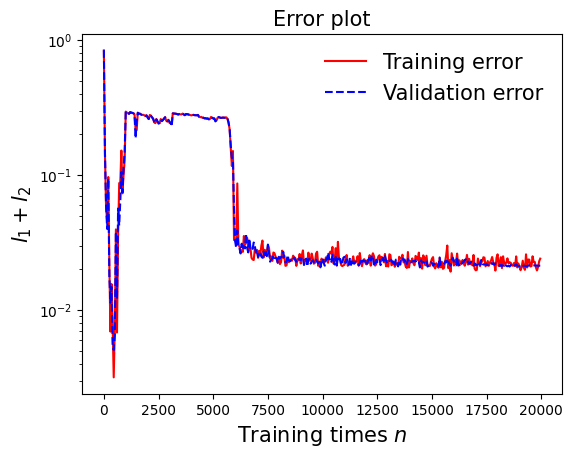

In [58]:
draw_loss(model2)

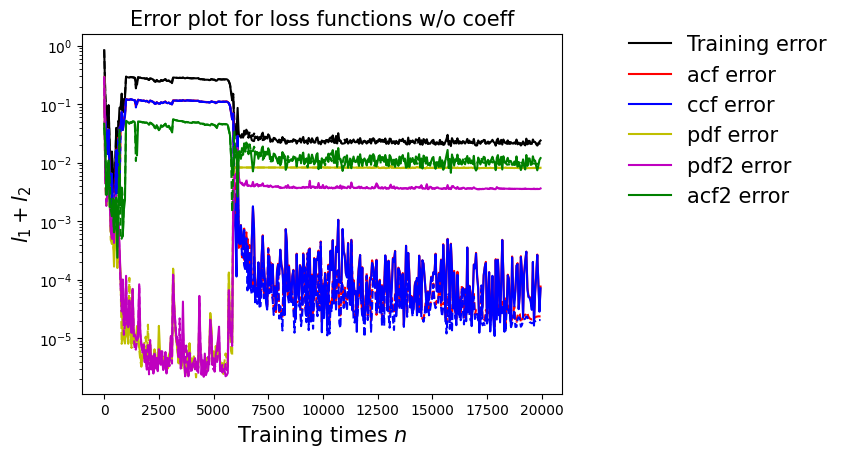

In [59]:
draw_errors(model2)

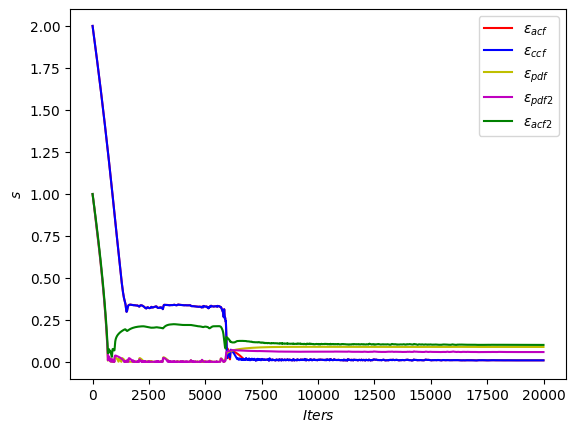

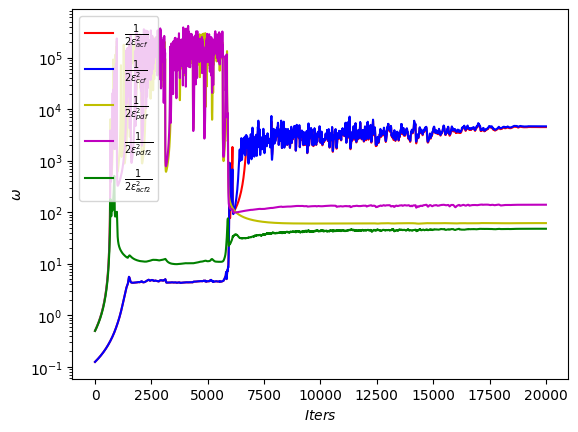

In [60]:
draw_adaptive_w(model2)
draw_epoch_w(model2)

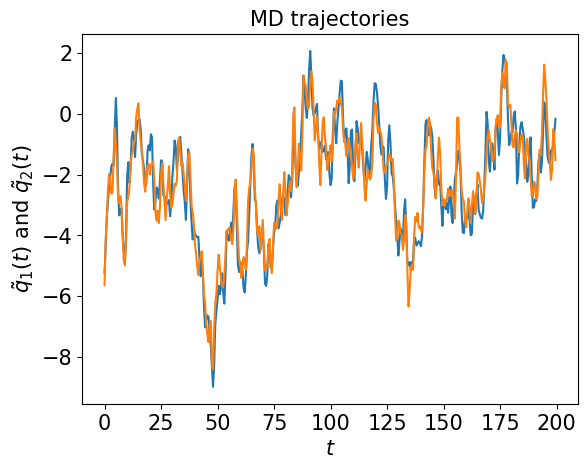

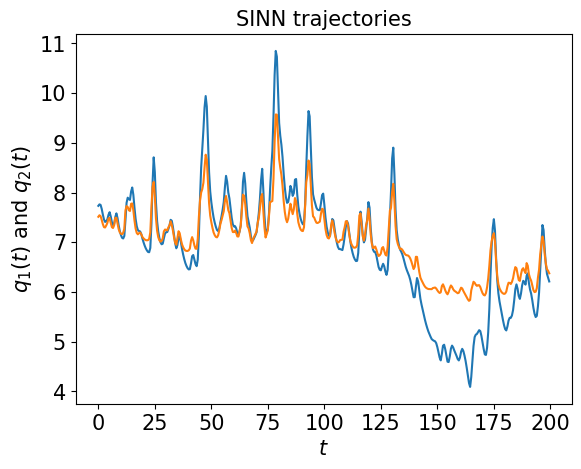

In [61]:
test1(model2)

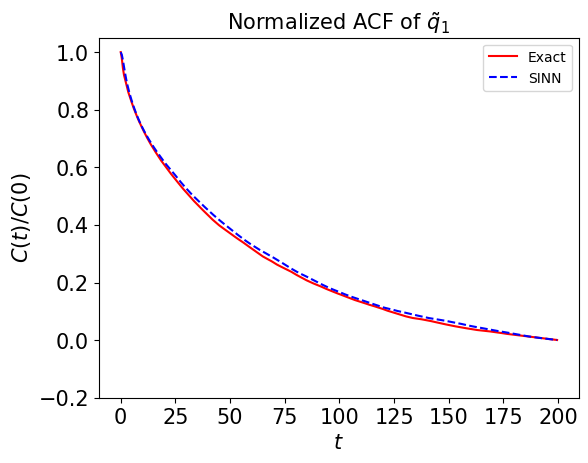

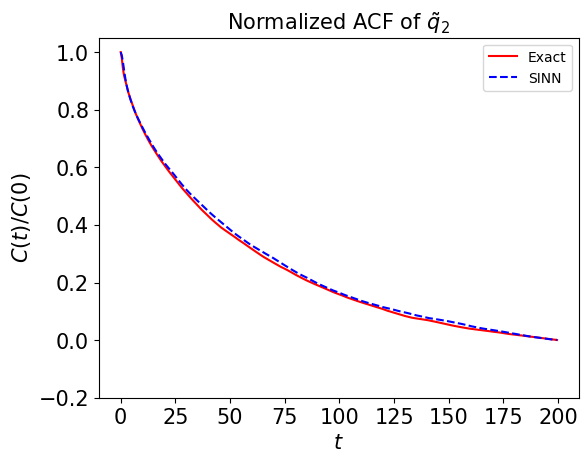

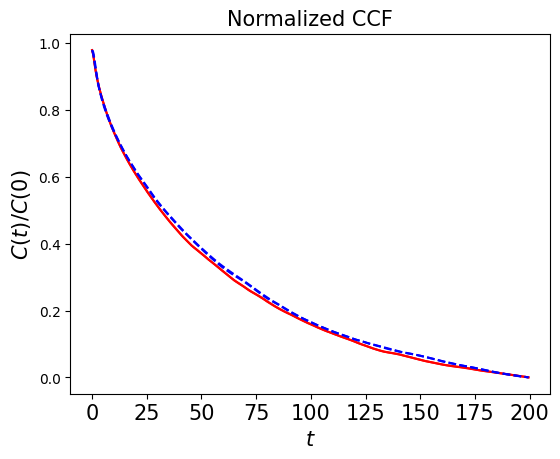

In [62]:
test2(model2)

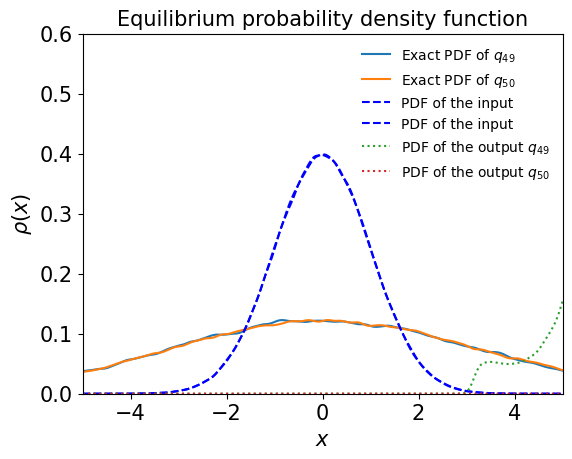

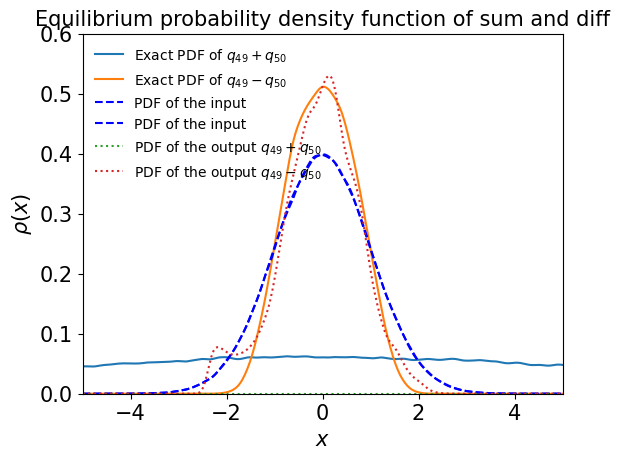

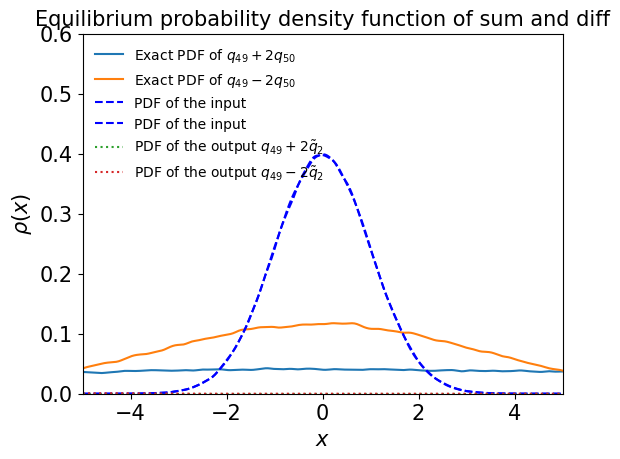

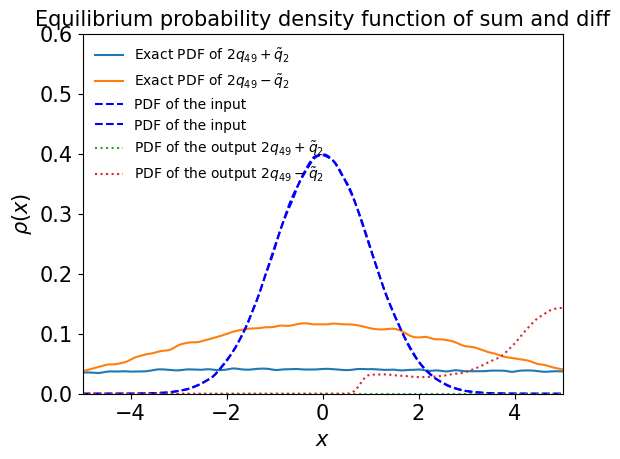

In [63]:
test3(model2)

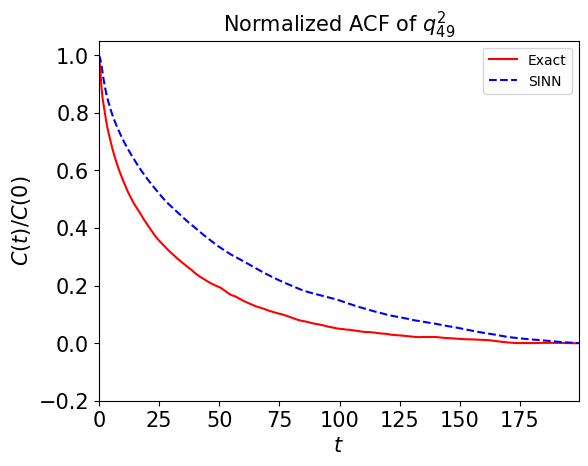

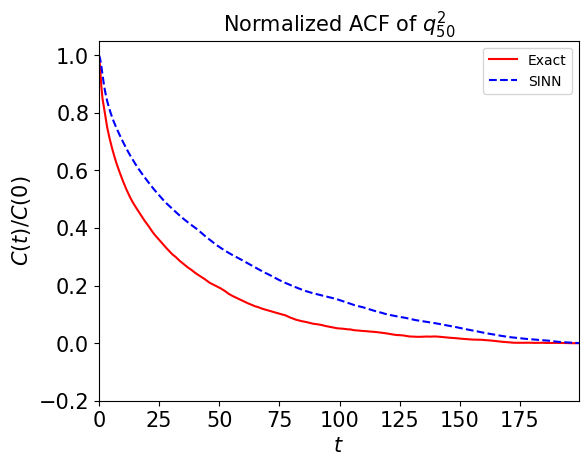

In [64]:
test4(model2)

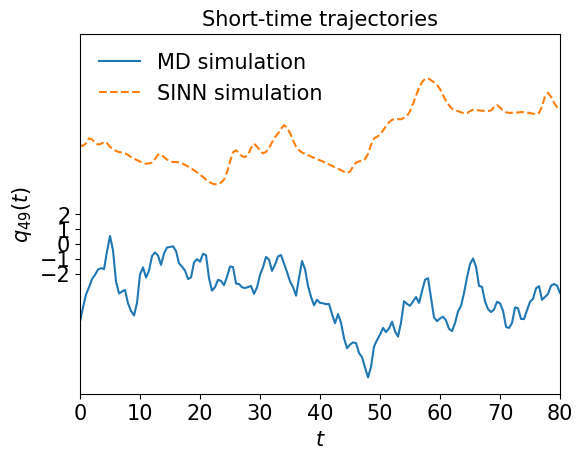

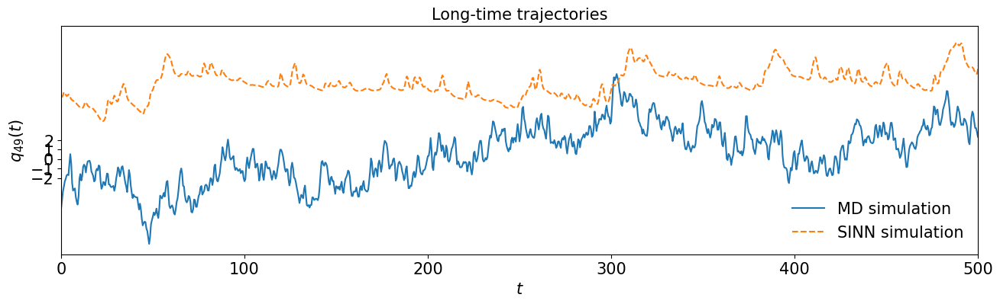

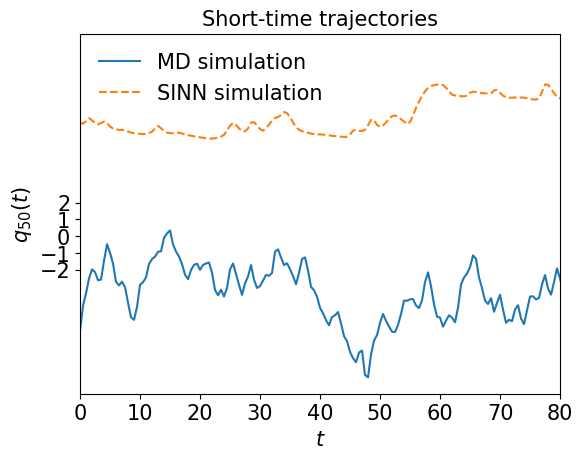

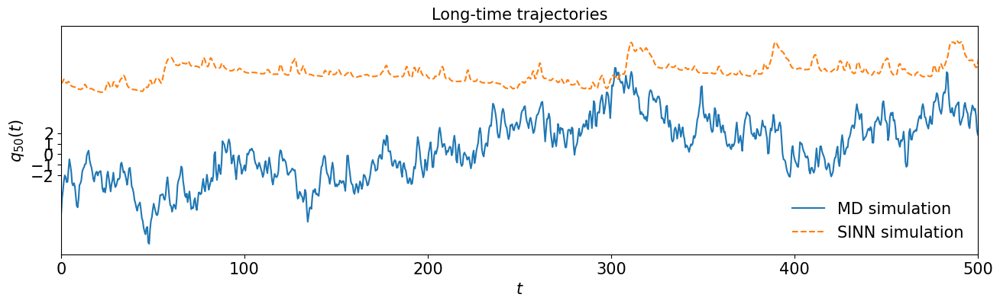

In [65]:
test5(model2)

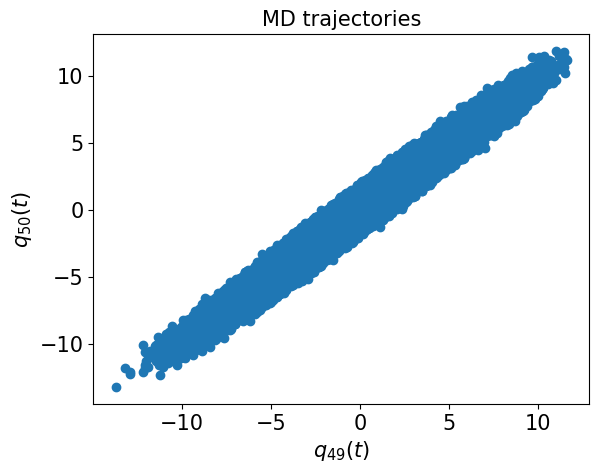

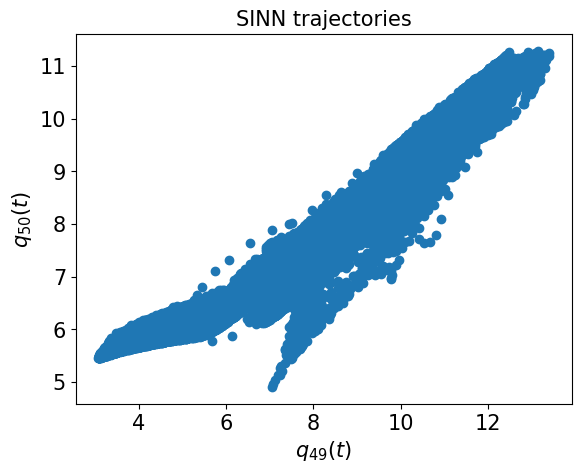

In [66]:
test6(model2)

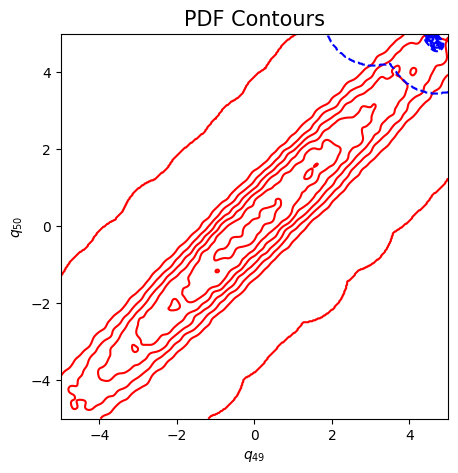

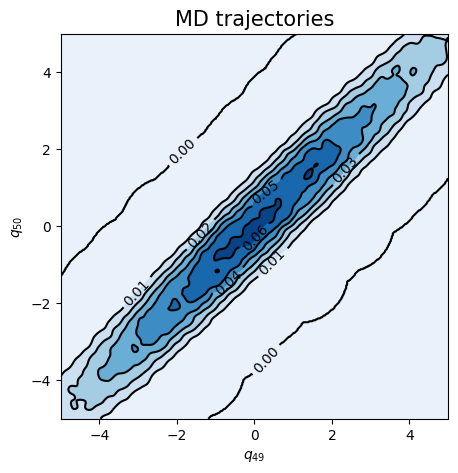

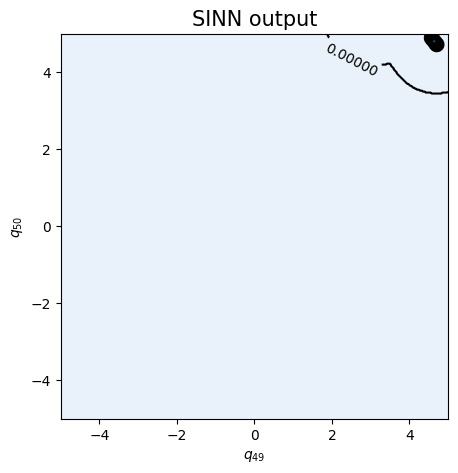

In [67]:
test7(model2)

In [68]:
### Defining SINN model
net3 = SINN(2, 100, 5, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model3 = Model(net=net3)
model3.train()

[0]-th step loss: 0.8512, 0.8119, acf: 0.09481, ccf: 0.09459, pdf: 0.29327, pdf2: 0.29018, acf2: 0.03910
[50]-th step loss: 0.1242, 0.1343, acf: 0.05111, ccf: 0.05101, pdf: 0.00885, pdf2: 0.00740, acf2: 0.01595
[100]-th step loss: 0.1334, 0.1737, acf: 0.06181, ccf: 0.06169, pdf: 0.01669, pdf2: 0.01488, acf2: 0.01868
[150]-th step loss: 0.5283, 0.6389, acf: 0.08023, ccf: 0.08033, pdf: 0.30576, pdf2: 0.14392, acf2: 0.02865
[200]-th step loss: 0.4838, 0.4663, acf: 0.01082, ccf: 0.01073, pdf: 0.30166, pdf2: 0.14263, acf2: 0.00050
[250]-th step loss: 0.4558, 0.4574, acf: 0.00706, ccf: 0.00701, pdf: 0.29971, pdf2: 0.14208, acf2: 0.00158
[300]-th step loss: 0.4538, 0.4586, acf: 0.00780, ccf: 0.00775, pdf: 0.29967, pdf2: 0.14209, acf2: 0.00132
[350]-th step loss: 0.4627, 0.4806, acf: 0.01929, ccf: 0.01921, pdf: 0.29967, pdf2: 0.14210, acf2: 0.00038
[400]-th step loss: 0.4573, 0.4593, acf: 0.00811, ccf: 0.00807, pdf: 0.29968, pdf2: 0.14209, acf2: 0.00136
[450]-th step loss: 0.4742, 0.4679, acf:

[3850]-th step loss: 0.4777, 0.4678, acf: 0.01296, ccf: 0.01290, pdf: 0.29968, pdf2: 0.14209, acf2: 0.00014
[3900]-th step loss: 0.4677, 0.4660, acf: 0.01203, ccf: 0.01196, pdf: 0.29969, pdf2: 0.14208, acf2: 0.00025
[3950]-th step loss: 0.4806, 0.4726, acf: 0.01539, ccf: 0.01532, pdf: 0.29965, pdf2: 0.14212, acf2: 0.00012
[4000]-th step loss: 0.4701, 0.4702, acf: 0.01424, ccf: 0.01417, pdf: 0.29971, pdf2: 0.14208, acf2: 0.00004
[4050]-th step loss: 0.4707, 0.4721, acf: 0.01516, ccf: 0.01509, pdf: 0.29975, pdf2: 0.14208, acf2: 0.00006
[4100]-th step loss: 0.4650, 0.4666, acf: 0.01237, ccf: 0.01230, pdf: 0.29973, pdf2: 0.14208, acf2: 0.00016
[4150]-th step loss: 0.4674, 0.4635, acf: 0.01068, ccf: 0.01061, pdf: 0.29968, pdf2: 0.14209, acf2: 0.00043
[4200]-th step loss: 0.4658, 0.4670, acf: 0.01255, ccf: 0.01249, pdf: 0.29972, pdf2: 0.14208, acf2: 0.00015
[4250]-th step loss: 0.4663, 0.4660, acf: 0.01207, ccf: 0.01200, pdf: 0.29968, pdf2: 0.14209, acf2: 0.00019
[4300]-th step loss: 0.4649,

[7650]-th step loss: 0.4754, 0.4716, acf: 0.01491, ccf: 0.01483, pdf: 0.29971, pdf2: 0.14208, acf2: 0.00006
[7700]-th step loss: 0.4710, 0.4664, acf: 0.01223, ccf: 0.01216, pdf: 0.29971, pdf2: 0.14208, acf2: 0.00017
[7750]-th step loss: 0.4785, 0.4710, acf: 0.01461, ccf: 0.01454, pdf: 0.29970, pdf2: 0.14208, acf2: 0.00004
[7800]-th step loss: 0.4656, 0.4687, acf: 0.01349, ccf: 0.01342, pdf: 0.29965, pdf2: 0.14211, acf2: 0.00007
[7850]-th step loss: 0.4769, 0.4674, acf: 0.01272, ccf: 0.01265, pdf: 0.29973, pdf2: 0.14208, acf2: 0.00018
[7900]-th step loss: 0.4720, 0.4666, acf: 0.01234, ccf: 0.01228, pdf: 0.29967, pdf2: 0.14209, acf2: 0.00019
[7950]-th step loss: 0.4668, 0.4694, acf: 0.01382, ccf: 0.01375, pdf: 0.29970, pdf2: 0.14208, acf2: 0.00005
[8000]-th step loss: 0.4728, 0.4660, acf: 0.01202, ccf: 0.01195, pdf: 0.29964, pdf2: 0.14215, acf2: 0.00028
[8050]-th step loss: 0.4622, 0.4678, acf: 0.01301, ccf: 0.01294, pdf: 0.29969, pdf2: 0.14209, acf2: 0.00012
[8100]-th step loss: 0.4713,

[11450]-th step loss: 0.4772, 0.4700, acf: 0.01411, ccf: 0.01404, pdf: 0.29972, pdf2: 0.14208, acf2: 0.00005
[11500]-th step loss: 0.4739, 0.4673, acf: 0.01270, ccf: 0.01264, pdf: 0.29969, pdf2: 0.14210, acf2: 0.00013
[11550]-th step loss: 0.4705, 0.4654, acf: 0.01171, ccf: 0.01165, pdf: 0.29967, pdf2: 0.14209, acf2: 0.00023
[11600]-th step loss: 0.4671, 0.4670, acf: 0.01256, ccf: 0.01249, pdf: 0.29968, pdf2: 0.14209, acf2: 0.00013
[11650]-th step loss: 0.4871, 0.4710, acf: 0.01466, ccf: 0.01459, pdf: 0.29966, pdf2: 0.14210, acf2: 0.00003
[11700]-th step loss: 0.4741, 0.4703, acf: 0.01426, ccf: 0.01419, pdf: 0.29969, pdf2: 0.14209, acf2: 0.00006
[11750]-th step loss: 0.4735, 0.4668, acf: 0.01247, ccf: 0.01240, pdf: 0.29969, pdf2: 0.14208, acf2: 0.00014
[11800]-th step loss: 0.4702, 0.4683, acf: 0.01325, ccf: 0.01318, pdf: 0.29971, pdf2: 0.14208, acf2: 0.00008
[11850]-th step loss: 0.4726, 0.4696, acf: 0.01389, ccf: 0.01382, pdf: 0.29972, pdf2: 0.14208, acf2: 0.00005
[11900]-th step los

[15250]-th step loss: 0.4731, 0.4693, acf: 0.01377, ccf: 0.01370, pdf: 0.29969, pdf2: 0.14209, acf2: 0.00006
[15300]-th step loss: 0.4716, 0.4688, acf: 0.01349, ccf: 0.01342, pdf: 0.29969, pdf2: 0.14209, acf2: 0.00007
[15350]-th step loss: 0.4712, 0.4695, acf: 0.01385, ccf: 0.01378, pdf: 0.29969, pdf2: 0.14208, acf2: 0.00006
[15400]-th step loss: 0.4720, 0.4688, acf: 0.01352, ccf: 0.01345, pdf: 0.29968, pdf2: 0.14209, acf2: 0.00007
[15450]-th step loss: 0.4726, 0.4691, acf: 0.01366, ccf: 0.01359, pdf: 0.29971, pdf2: 0.14208, acf2: 0.00006
[15500]-th step loss: 0.4735, 0.4696, acf: 0.01390, ccf: 0.01383, pdf: 0.29969, pdf2: 0.14208, acf2: 0.00005
[15550]-th step loss: 0.4769, 0.4668, acf: 0.01245, ccf: 0.01239, pdf: 0.29969, pdf2: 0.14209, acf2: 0.00014
[15600]-th step loss: 0.4762, 0.4688, acf: 0.01350, ccf: 0.01343, pdf: 0.29968, pdf2: 0.14209, acf2: 0.00007
[15650]-th step loss: 0.4701, 0.4694, acf: 0.01383, ccf: 0.01376, pdf: 0.29970, pdf2: 0.14208, acf2: 0.00005
[15700]-th step los

[19050]-th step loss: 0.4707, 0.4691, acf: 0.01366, ccf: 0.01359, pdf: 0.29969, pdf2: 0.14208, acf2: 0.00006
[19100]-th step loss: 0.4663, 0.4694, acf: 0.01381, ccf: 0.01374, pdf: 0.29969, pdf2: 0.14208, acf2: 0.00005
[19150]-th step loss: 0.4726, 0.4691, acf: 0.01366, ccf: 0.01359, pdf: 0.29968, pdf2: 0.14209, acf2: 0.00006
[19200]-th step loss: 0.4676, 0.4690, acf: 0.01360, ccf: 0.01353, pdf: 0.29968, pdf2: 0.14209, acf2: 0.00006
[19250]-th step loss: 0.4697, 0.4688, acf: 0.01349, ccf: 0.01342, pdf: 0.29968, pdf2: 0.14209, acf2: 0.00007
[19300]-th step loss: 0.4719, 0.4688, acf: 0.01352, ccf: 0.01345, pdf: 0.29968, pdf2: 0.14209, acf2: 0.00007
[19350]-th step loss: 0.4766, 0.4684, acf: 0.01333, ccf: 0.01326, pdf: 0.29969, pdf2: 0.14208, acf2: 0.00008
[19400]-th step loss: 0.4682, 0.4687, acf: 0.01344, ccf: 0.01337, pdf: 0.29969, pdf2: 0.14209, acf2: 0.00007
[19450]-th step loss: 0.4705, 0.4688, acf: 0.01350, ccf: 0.01343, pdf: 0.29968, pdf2: 0.14209, acf2: 0.00007
[19500]-th step los

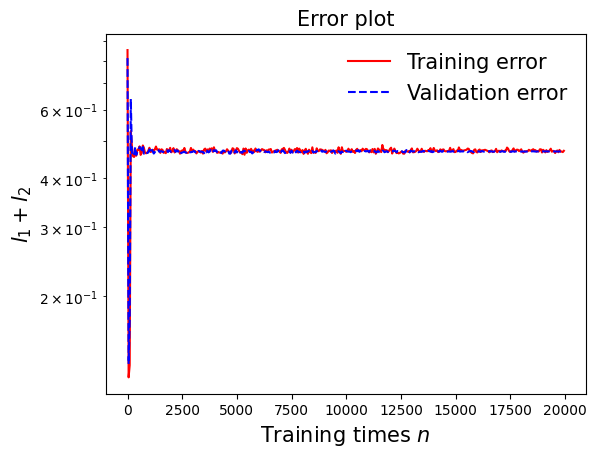

In [69]:
draw_loss(model3)

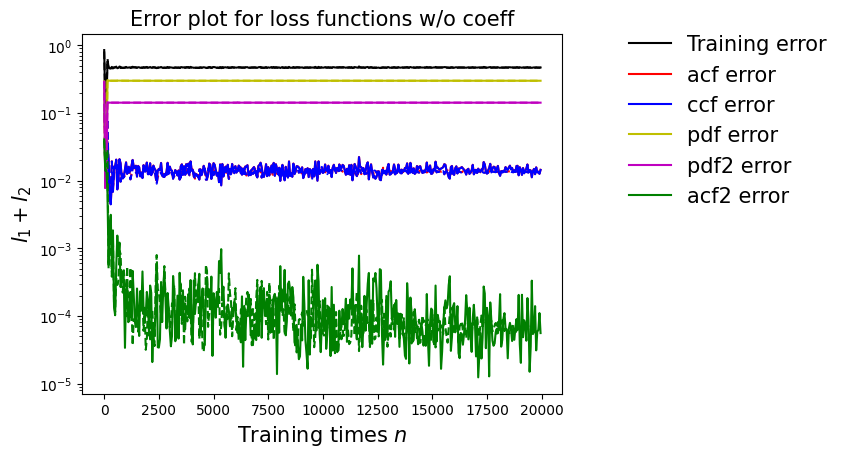

In [70]:
draw_errors(model3)

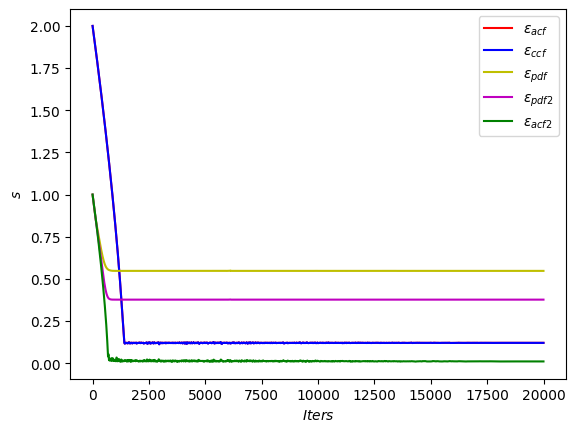

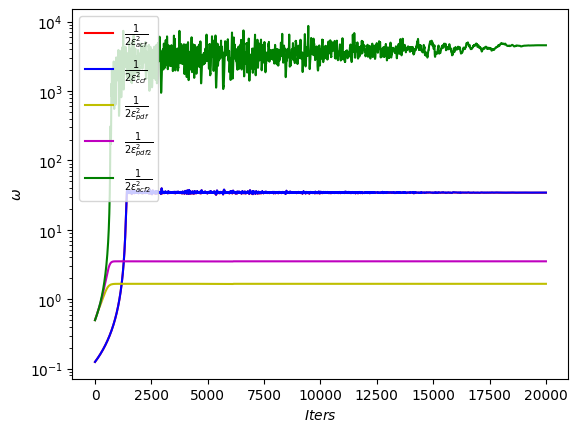

In [71]:
draw_adaptive_w(model3)
draw_epoch_w(model3)

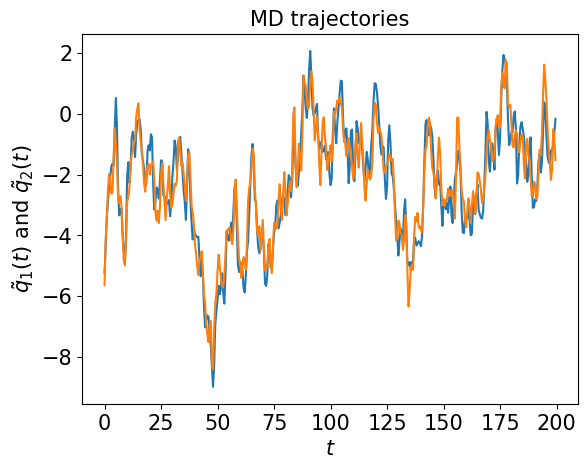

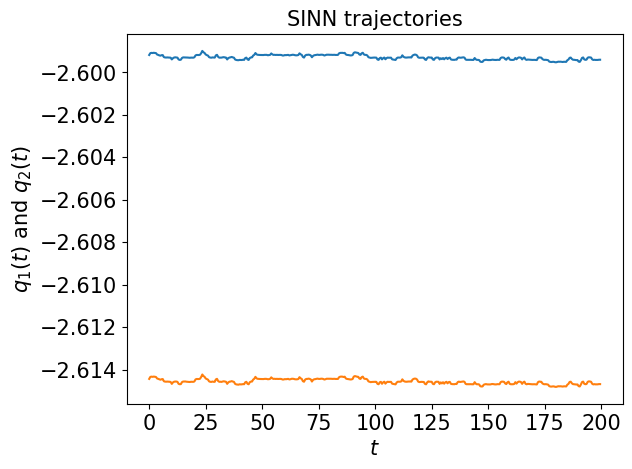

In [72]:
test1(model3)

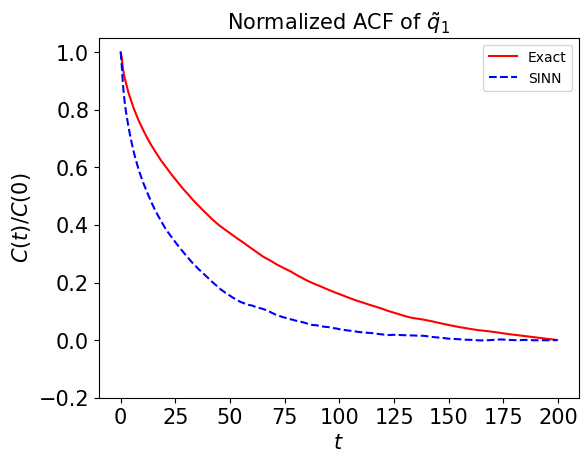

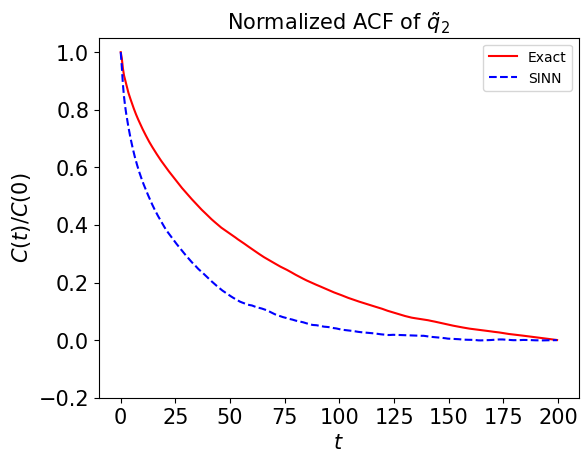

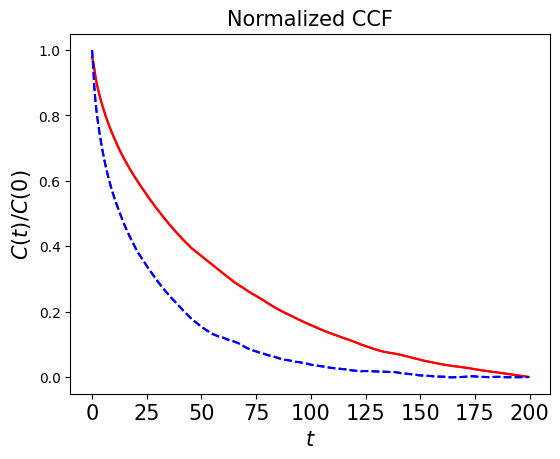

In [73]:
test2(model3)

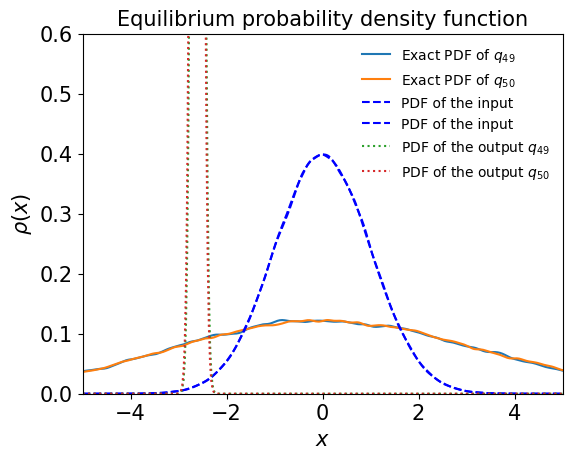

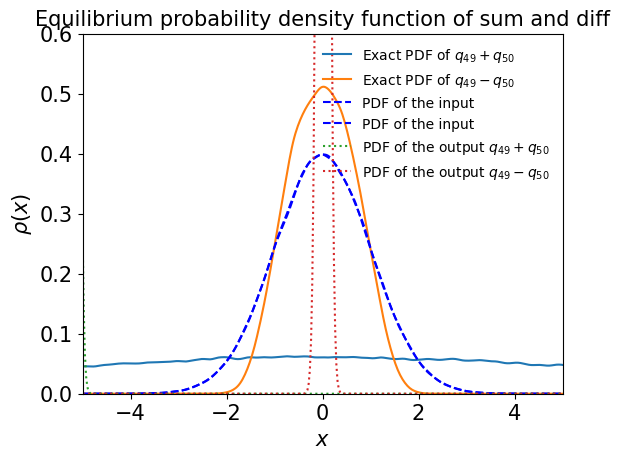

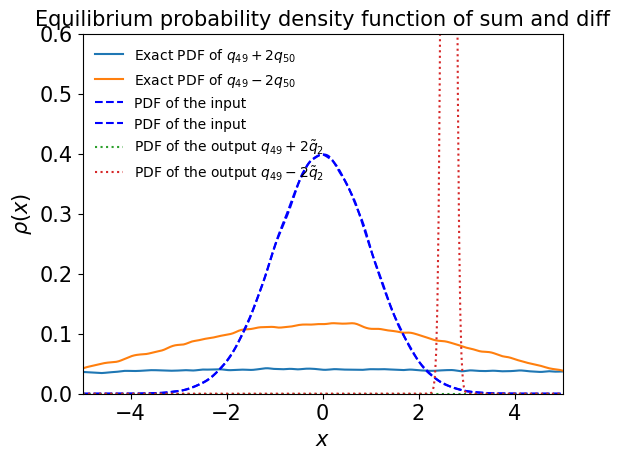

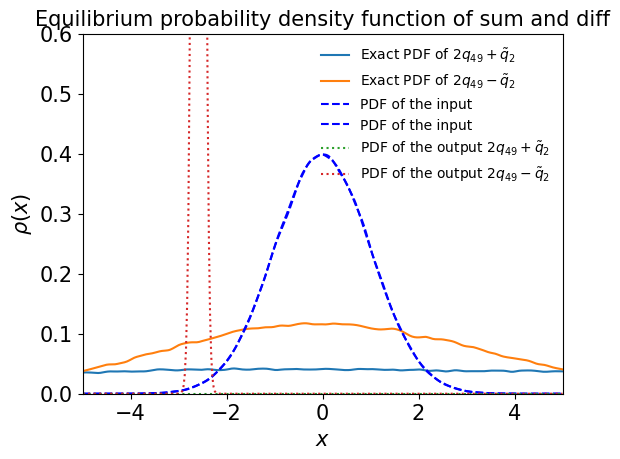

In [74]:
test3(model3)

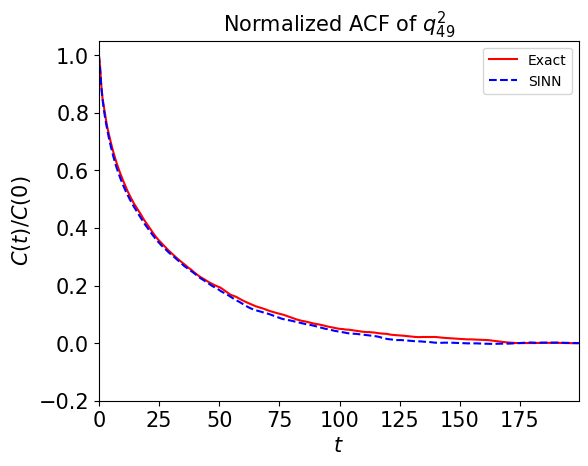

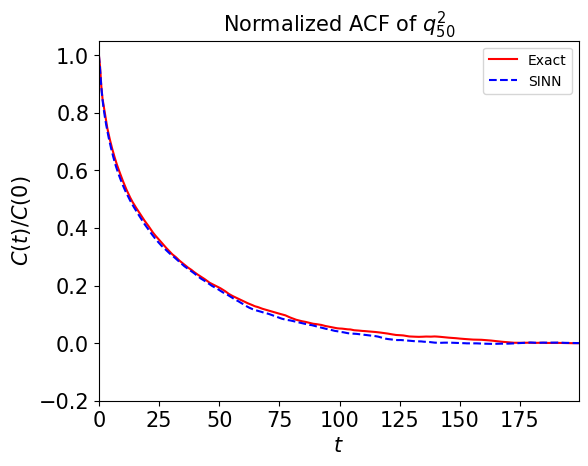

In [75]:
test4(model3)

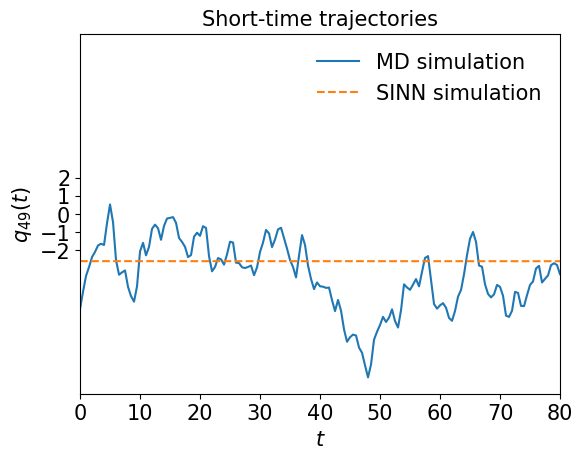

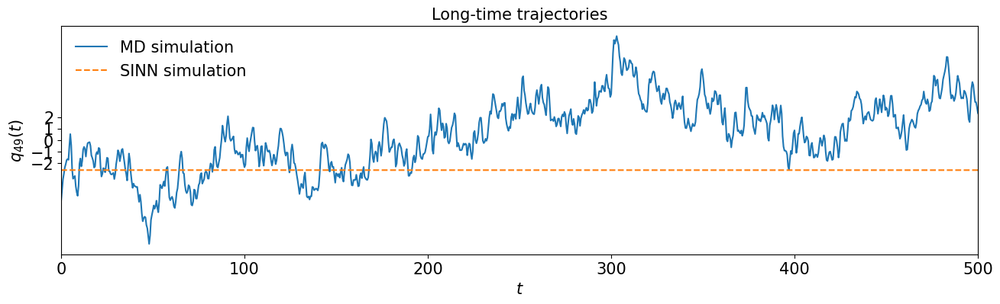

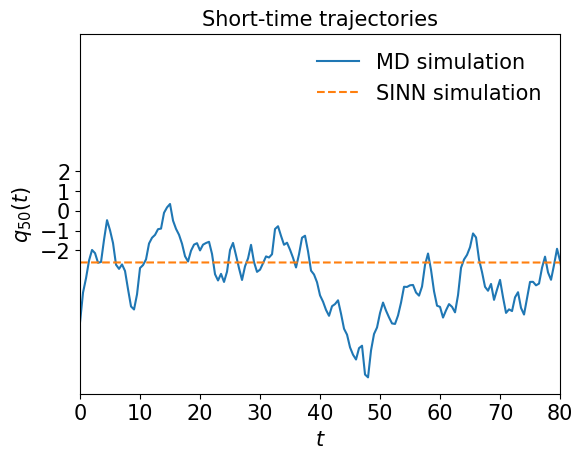

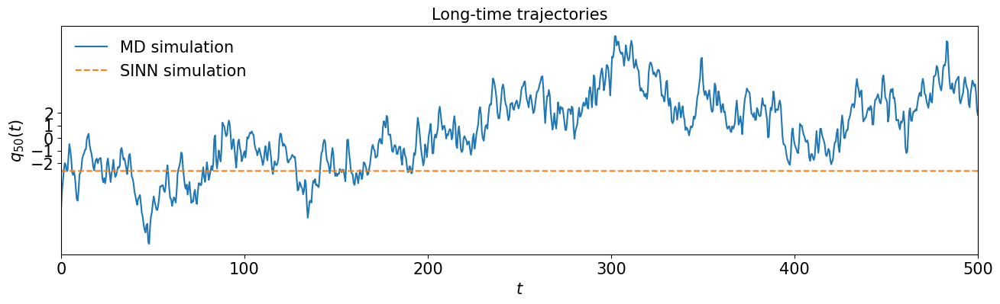

In [76]:
test5(model3)

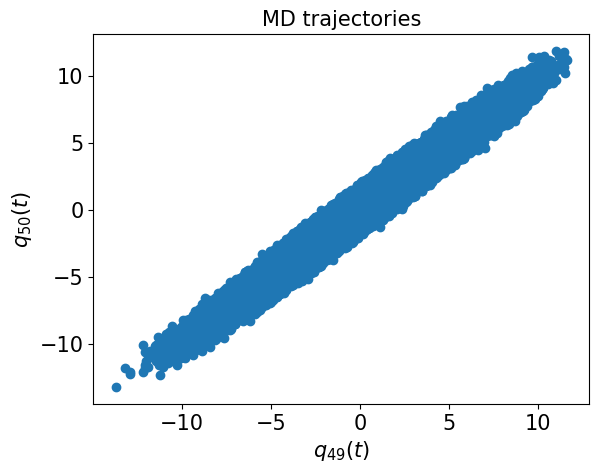

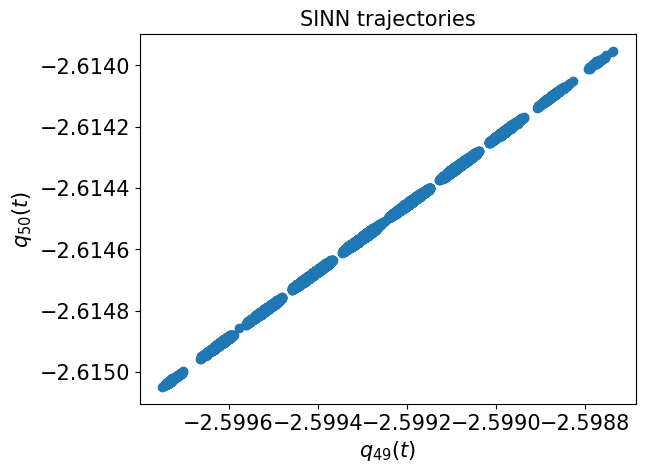

In [77]:
test6(model3)

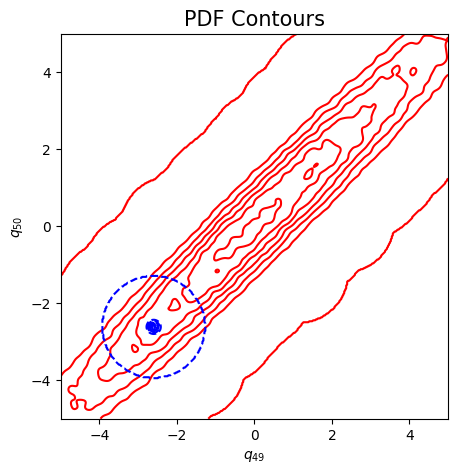

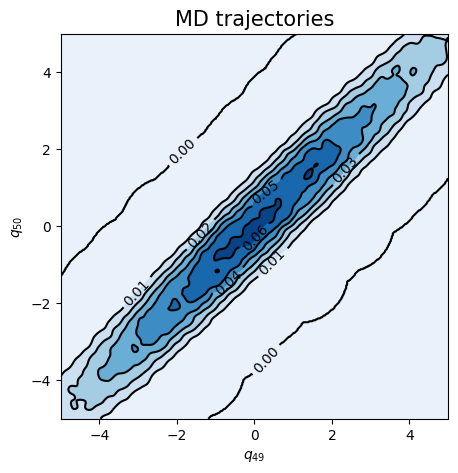

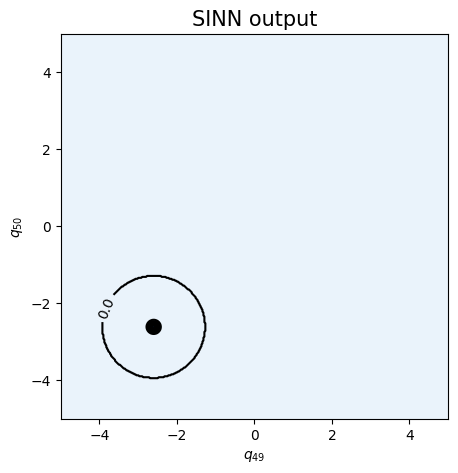

In [78]:
test7(model3)

In [79]:
### Defining SINN model
net4 = SINN(2, 100, 5, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model4 = Model(net=net4)
model4.train()

[0]-th step loss: 0.8362, 0.8133, acf: 0.09496, ccf: 0.09608, pdf: 0.29318, pdf2: 0.28993, acf2: 0.03916
[50]-th step loss: 0.1395, 0.1515, acf: 0.05741, ccf: 0.05730, pdf: 0.00851, pdf2: 0.00807, acf2: 0.02017
[100]-th step loss: 0.0169, 0.0242, acf: 0.00628, ccf: 0.00629, pdf: 0.00447, pdf2: 0.00317, acf2: 0.00401
[150]-th step loss: 0.0555, 0.0715, acf: 0.02835, ccf: 0.02830, pdf: 0.00262, pdf2: 0.00421, acf2: 0.00803
[200]-th step loss: 0.0385, 0.0414, acf: 0.01200, ccf: 0.01269, pdf: 0.00853, pdf2: 0.00536, acf2: 0.00280
[250]-th step loss: 0.0334, 0.0321, acf: 0.00857, ccf: 0.00897, pdf: 0.00819, pdf2: 0.00385, acf2: 0.00252
[300]-th step loss: 0.0403, 0.0363, acf: 0.01103, ccf: 0.01147, pdf: 0.00813, pdf2: 0.00426, acf2: 0.00144
[350]-th step loss: 0.0326, 0.0353, acf: 0.01136, ccf: 0.01140, pdf: 0.00796, pdf2: 0.00364, acf2: 0.00090
[400]-th step loss: 0.0405, 0.0451, acf: 0.01628, ccf: 0.01628, pdf: 0.00784, pdf2: 0.00389, acf2: 0.00084
[450]-th step loss: 0.0280, 0.0279, acf:

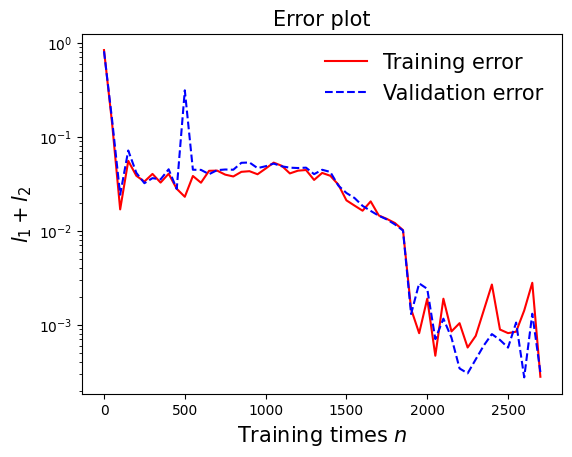

In [80]:
draw_loss(model4)

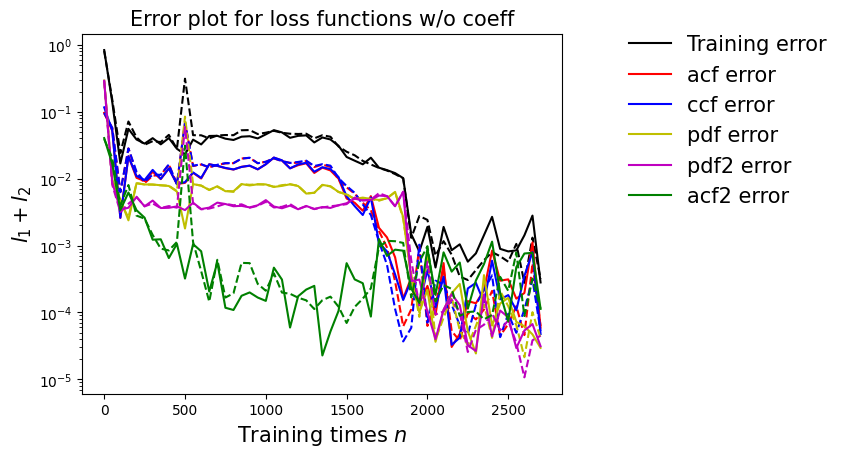

In [81]:
draw_errors(model4)

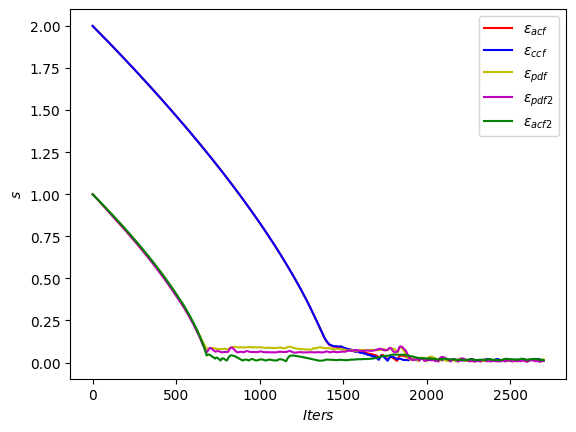

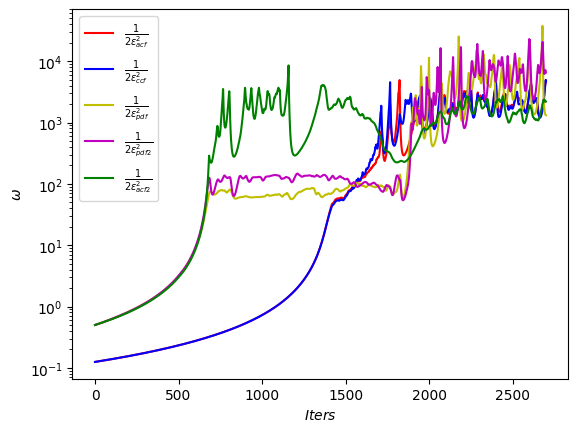

In [82]:
draw_adaptive_w(model4)
draw_epoch_w(model4)

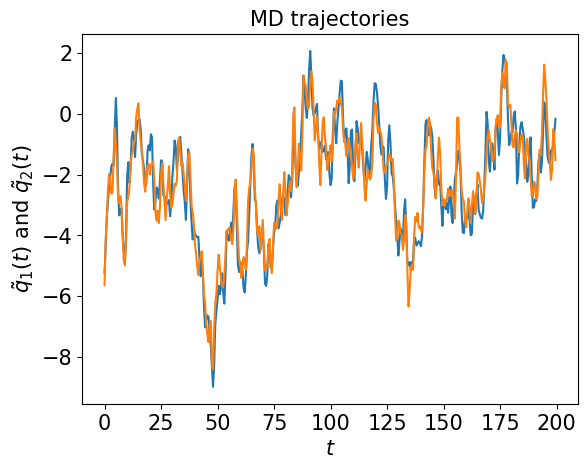

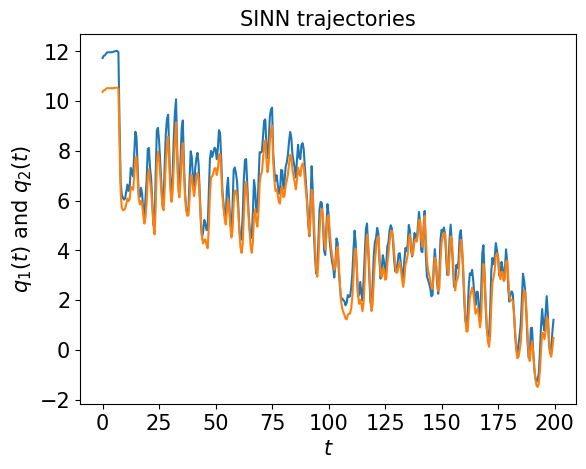

In [83]:
test1(model4)

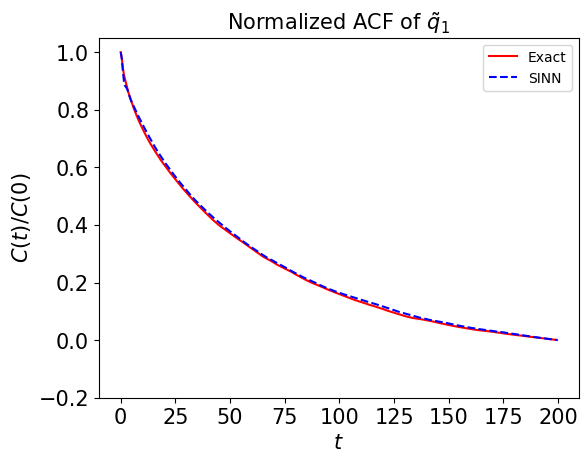

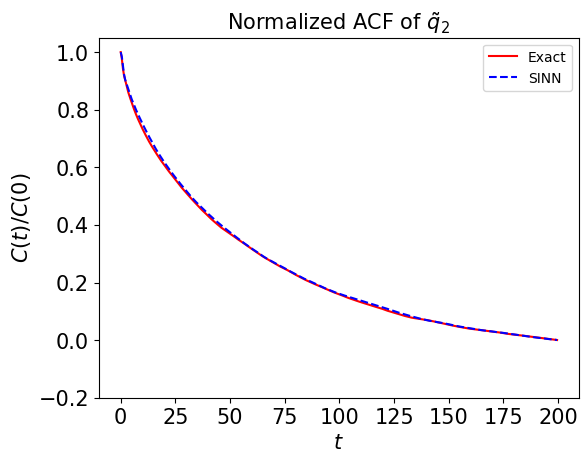

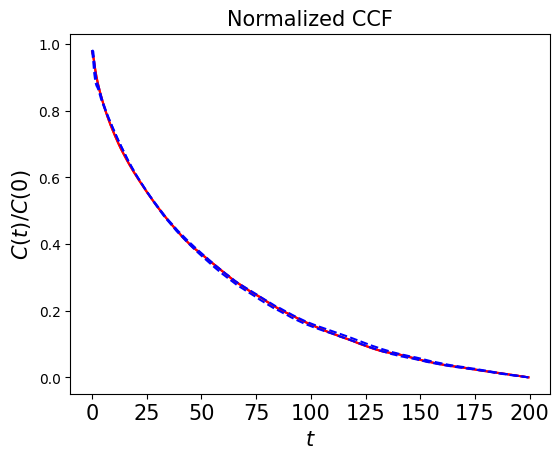

In [84]:
test2(model4)

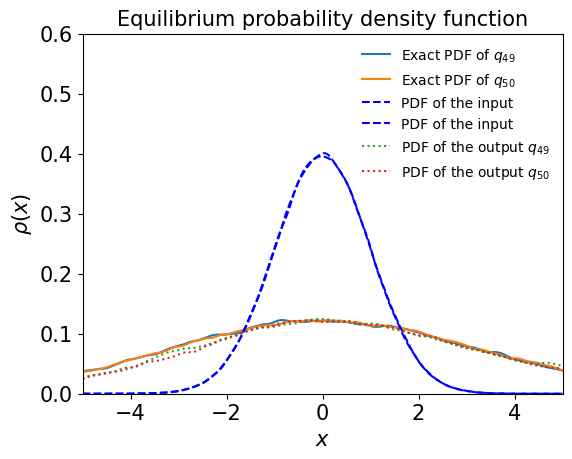

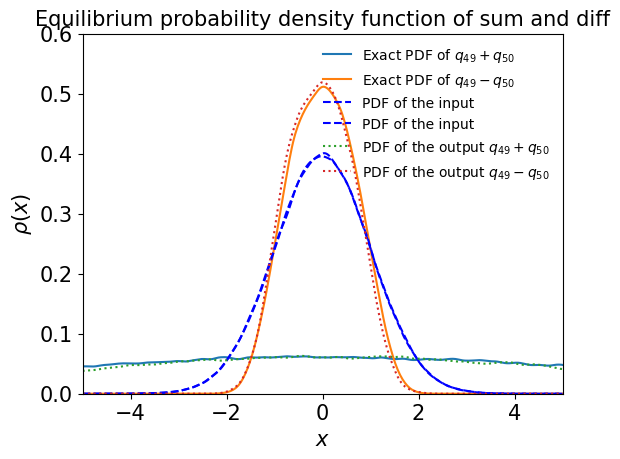

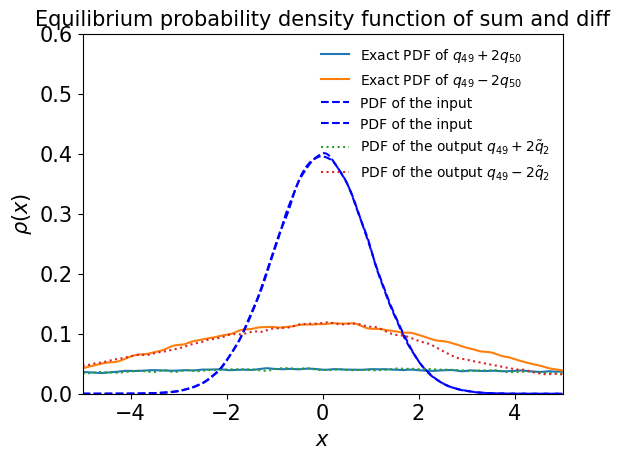

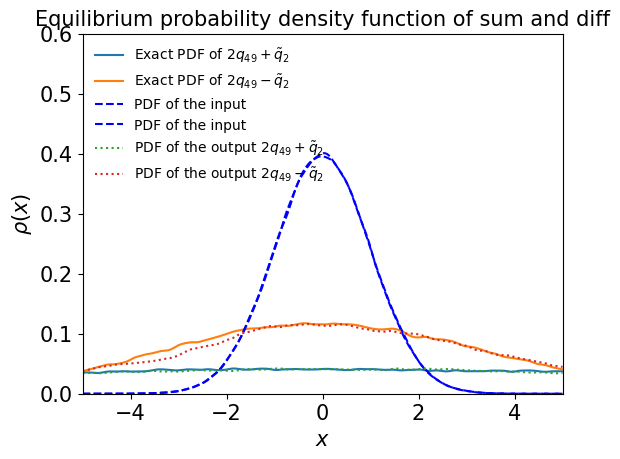

In [85]:
test3(model4)

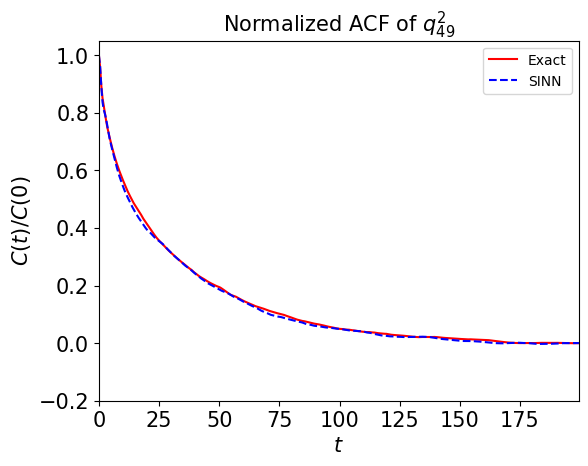

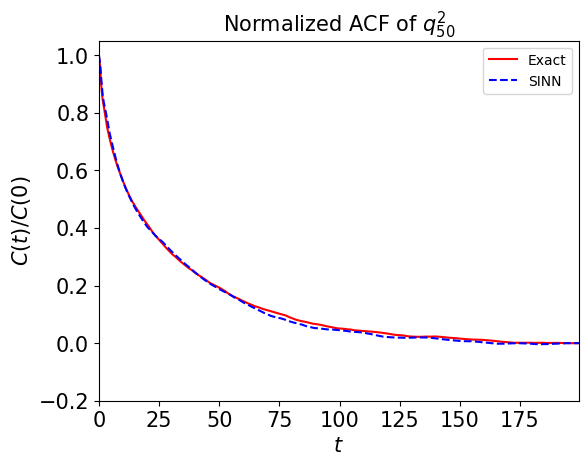

In [86]:
test4(model4)

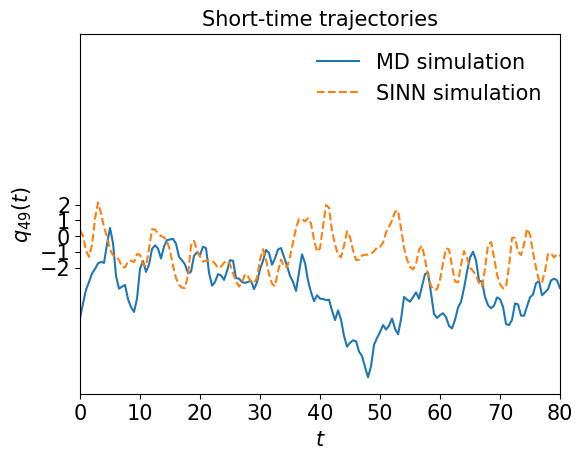

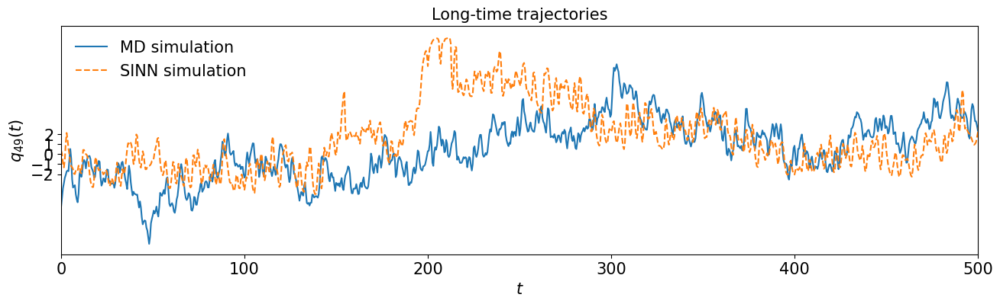

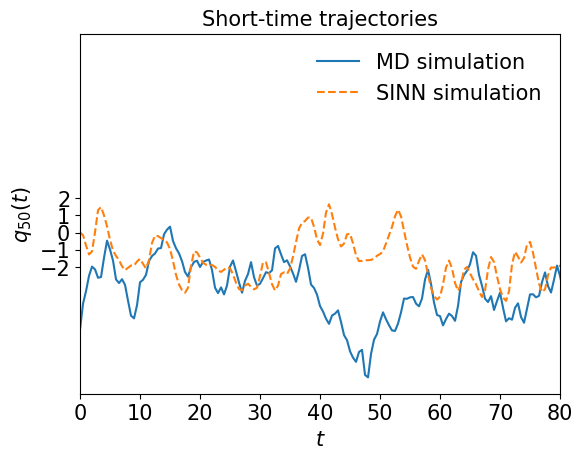

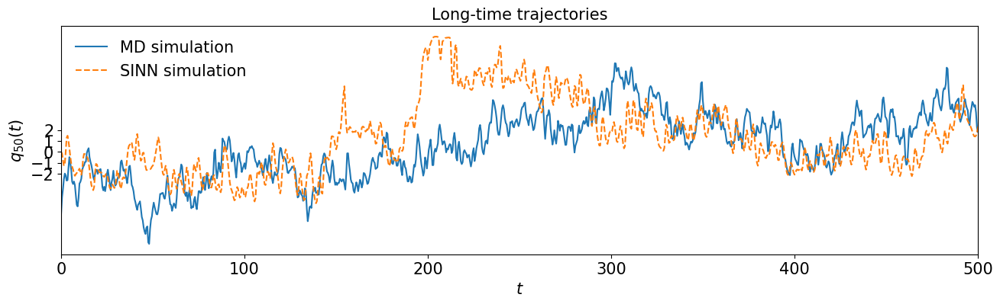

In [87]:
test5(model4)

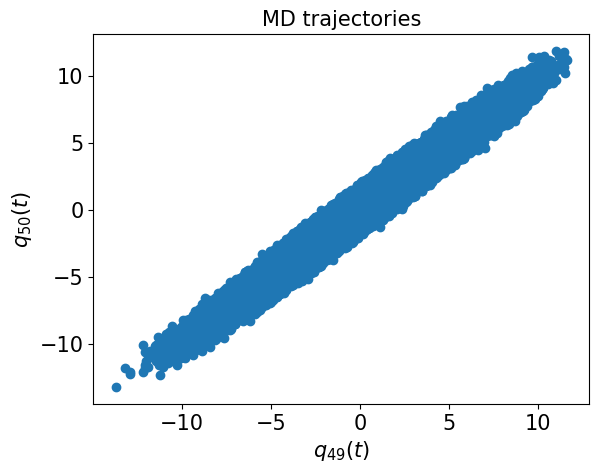

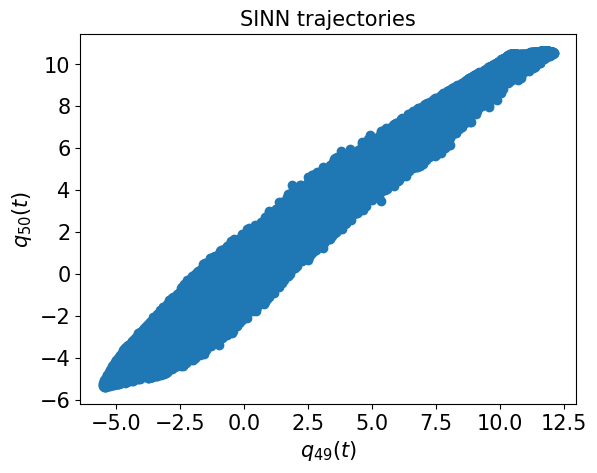

In [88]:
test6(model4)

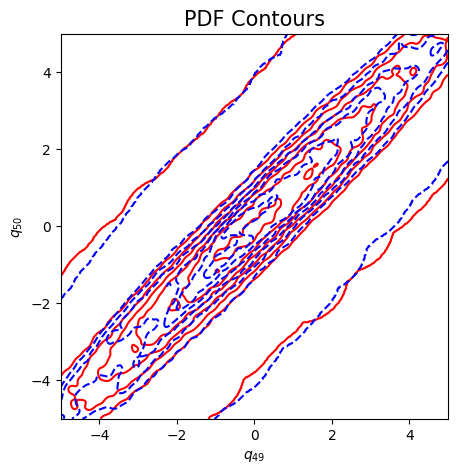

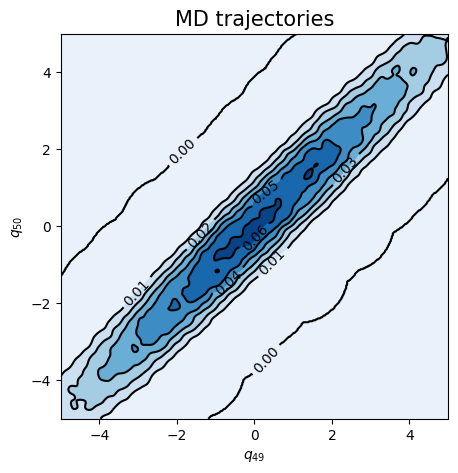

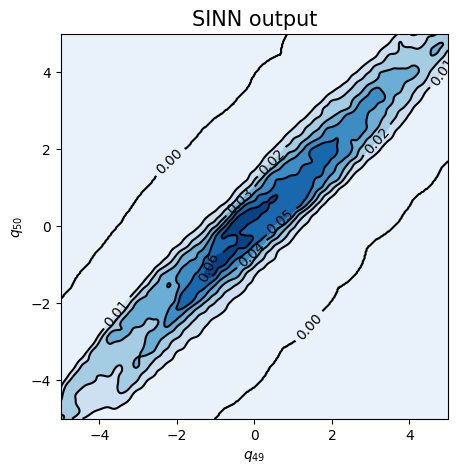

In [89]:
test7(model4)

In [90]:
### Defining SINN model
net5 = SINN(2, 100, 5, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model5 = Model(net=net5)
model5.train()

[0]-th step loss: 0.8407, 0.8121, acf: 0.09458, ccf: 0.09540, pdf: 0.29319, pdf2: 0.28993, acf2: 0.03899
[50]-th step loss: 0.0928, 0.0797, acf: 0.02913, ccf: 0.02907, pdf: 0.00474, pdf2: 0.00381, acf2: 0.01292
[100]-th step loss: 0.1127, 0.1381, acf: 0.04333, ccf: 0.04324, pdf: 0.02199, pdf2: 0.02157, acf2: 0.00799
[150]-th step loss: 0.0204, 0.0259, acf: 0.00843, ccf: 0.00846, pdf: 0.00288, pdf2: 0.00250, acf2: 0.00361
[200]-th step loss: 0.0436, 0.0472, acf: 0.01768, ccf: 0.01770, pdf: 0.00495, pdf2: 0.00277, acf2: 0.00411
[250]-th step loss: 0.0044, 0.0076, acf: 0.00181, ccf: 0.00181, pdf: 0.00121, pdf2: 0.00098, acf2: 0.00175
[300]-th step loss: 0.0034, 0.0030, acf: 0.00038, ccf: 0.00038, pdf: 0.00045, pdf2: 0.00057, acf2: 0.00122
[350]-th step loss: 0.0942, 0.0676, acf: 0.02292, ccf: 0.02280, pdf: 0.00829, pdf2: 0.00989, acf2: 0.00374
[400]-th step loss: 0.0317, 0.0352, acf: 0.01093, ccf: 0.01156, pdf: 0.00828, pdf2: 0.00366, acf2: 0.00076
[450]-th step loss: 0.0295, 0.0343, acf:

[3850]-th step loss: 0.0361, 0.0415, acf: 0.01473, ccf: 0.01469, pdf: 0.00823, pdf2: 0.00366, acf2: 0.00023
[3900]-th step loss: 0.0305, 0.0392, acf: 0.01360, ccf: 0.01357, pdf: 0.00818, pdf2: 0.00373, acf2: 0.00014
[3950]-th step loss: 0.0352, 0.0384, acf: 0.01328, ccf: 0.01327, pdf: 0.00818, pdf2: 0.00357, acf2: 0.00015
[4000]-th step loss: 0.0324, 0.0401, acf: 0.01410, ccf: 0.01407, pdf: 0.00815, pdf2: 0.00356, acf2: 0.00018
[4050]-th step loss: 0.0330, 0.0367, acf: 0.01241, ccf: 0.01237, pdf: 0.00828, pdf2: 0.00357, acf2: 0.00009
[4100]-th step loss: 0.0243, 0.0324, acf: 0.01030, ccf: 0.01026, pdf: 0.00815, pdf2: 0.00359, acf2: 0.00012
[4150]-th step loss: 0.0366, 0.0344, acf: 0.01126, ccf: 0.01123, pdf: 0.00821, pdf2: 0.00368, acf2: 0.00005
[4200]-th step loss: 0.0425, 0.0368, acf: 0.01251, ccf: 0.01247, pdf: 0.00815, pdf2: 0.00357, acf2: 0.00014
[4250]-th step loss: 0.0337, 0.0341, acf: 0.01115, ccf: 0.01112, pdf: 0.00815, pdf2: 0.00366, acf2: 0.00007
[4300]-th step loss: 0.0272,

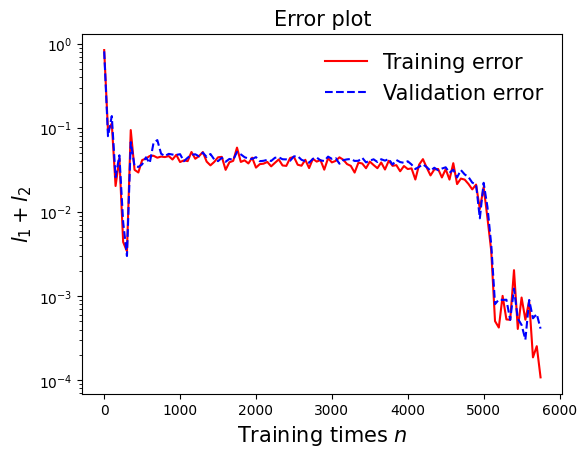

In [91]:
draw_loss(model5)

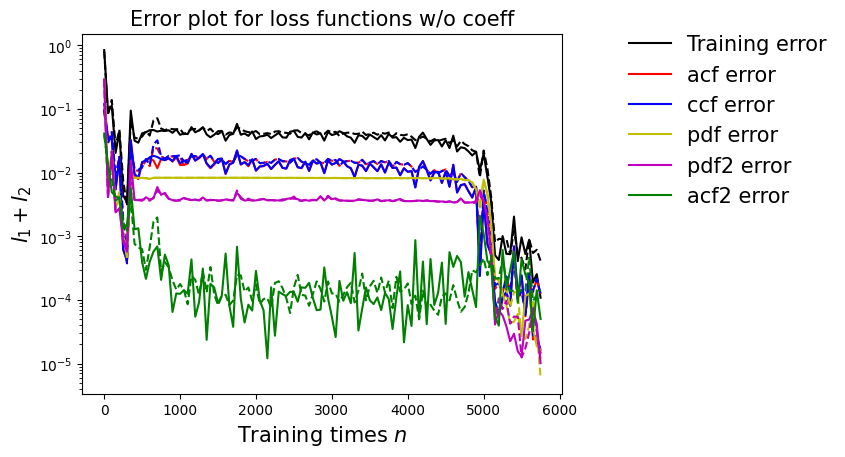

In [92]:
draw_errors(model5)

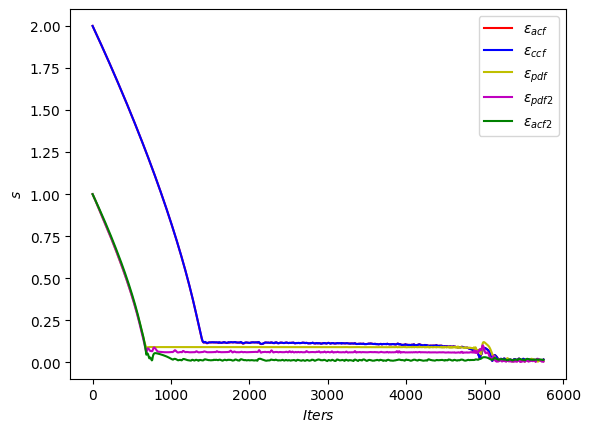

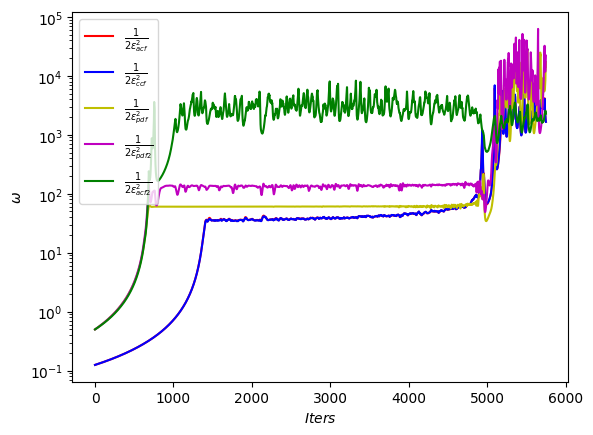

In [93]:
draw_adaptive_w(model5)
draw_epoch_w(model5)

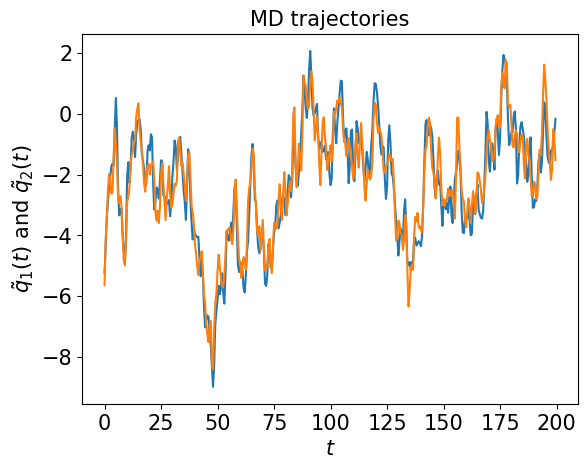

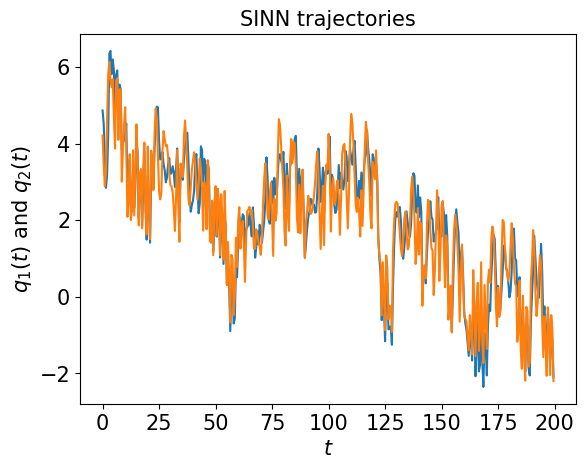

In [94]:
test1(model5)

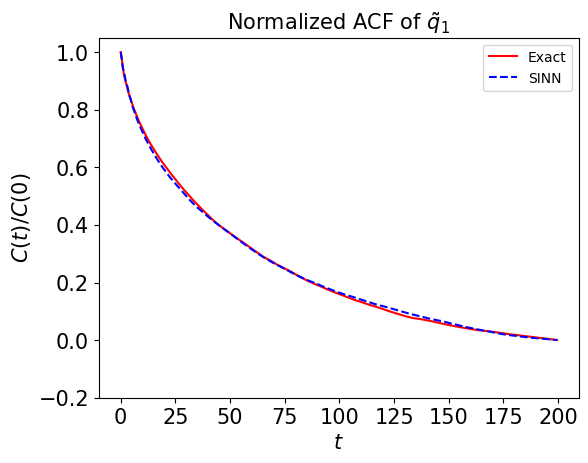

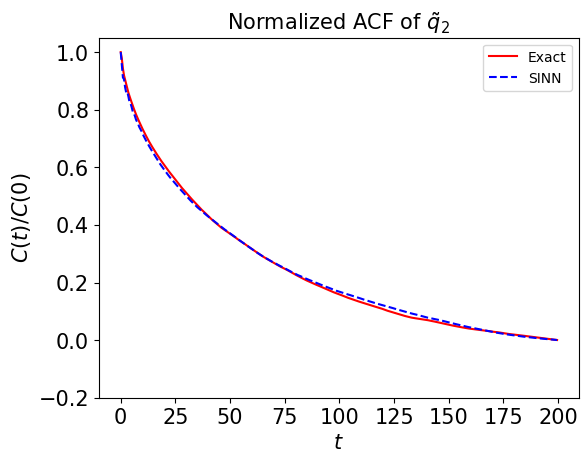

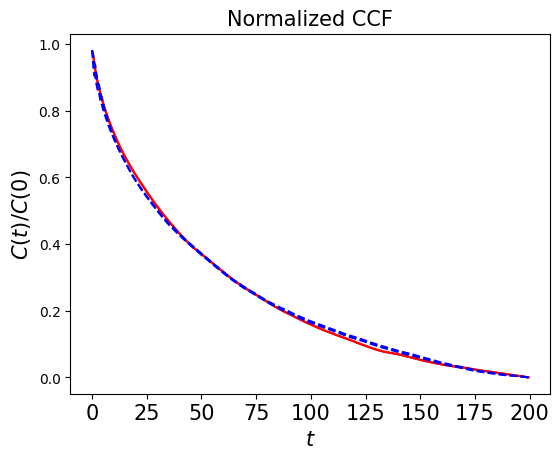

In [95]:
test2(model5)

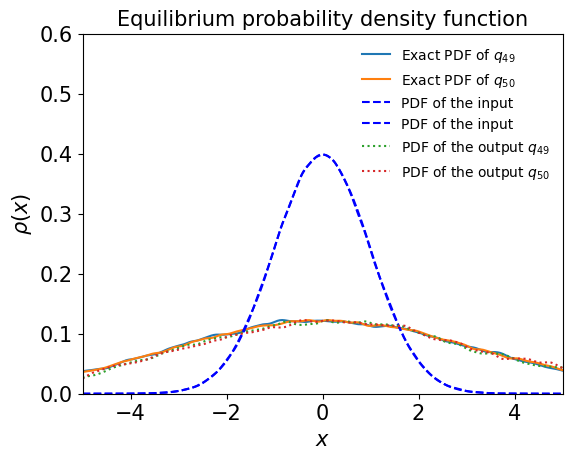

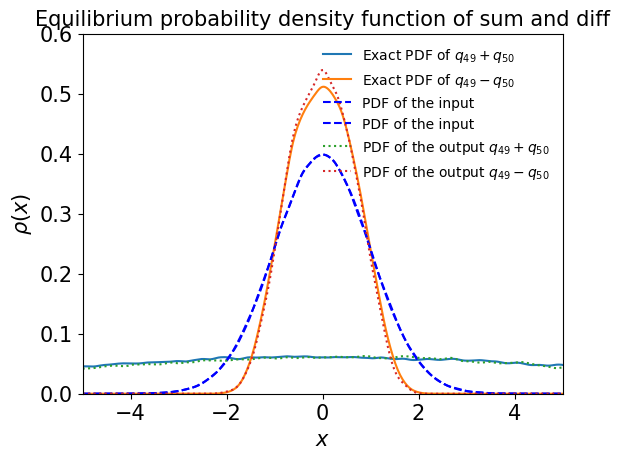

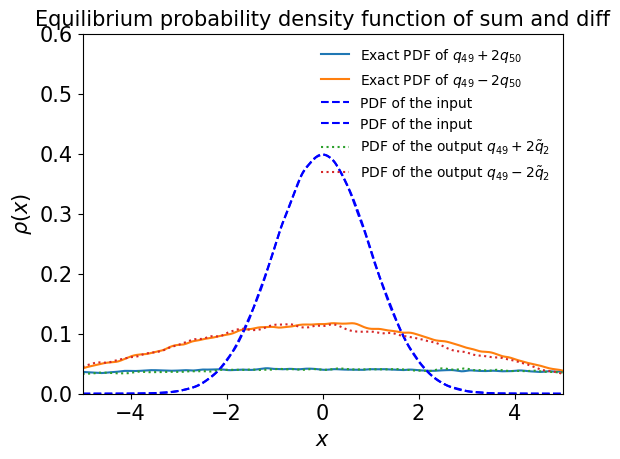

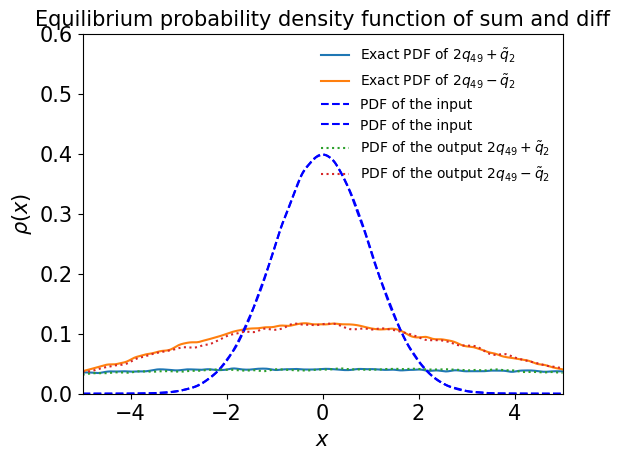

In [96]:
test3(model5)

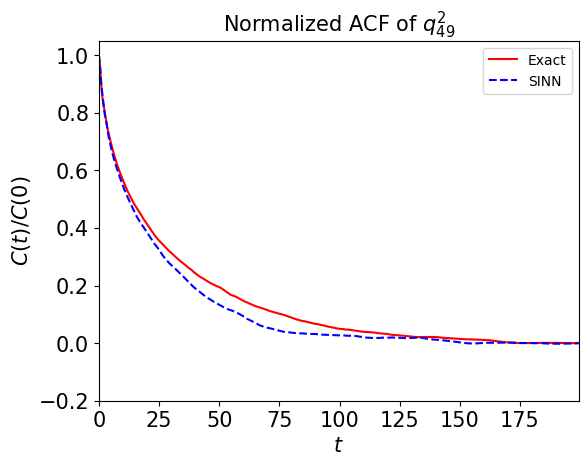

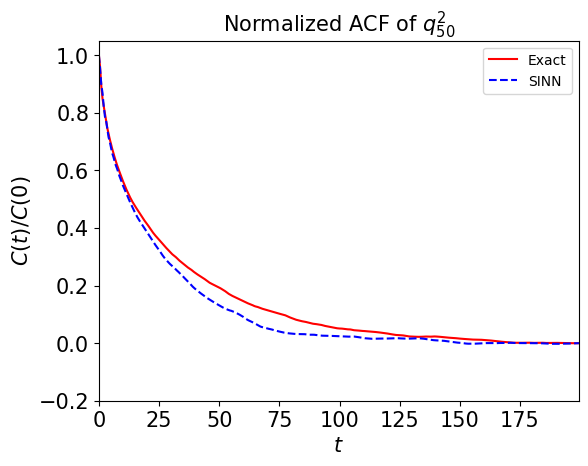

In [97]:
test4(model5)

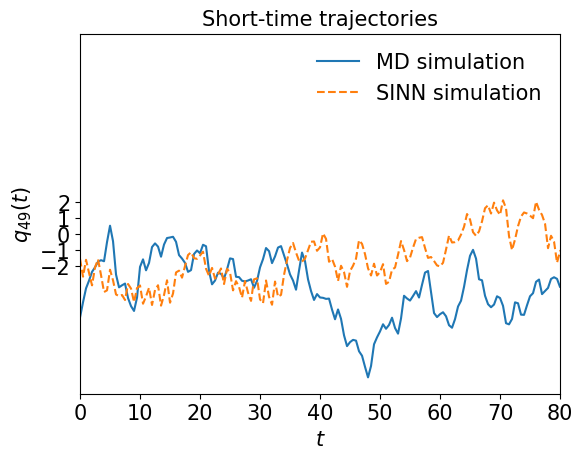

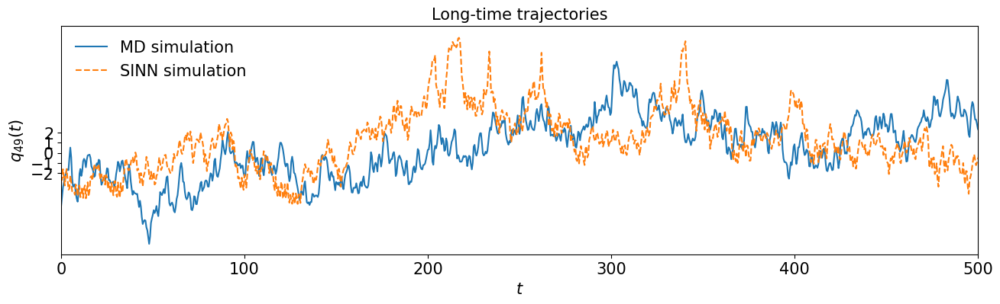

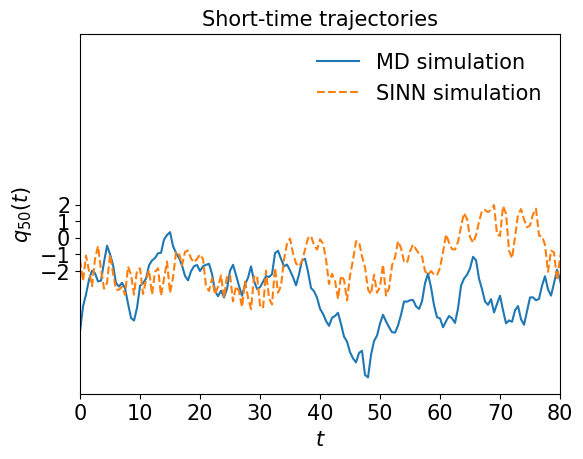

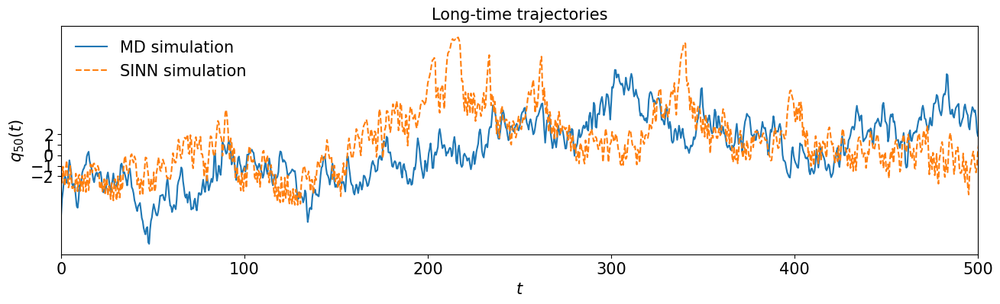

In [98]:
test5(model5)

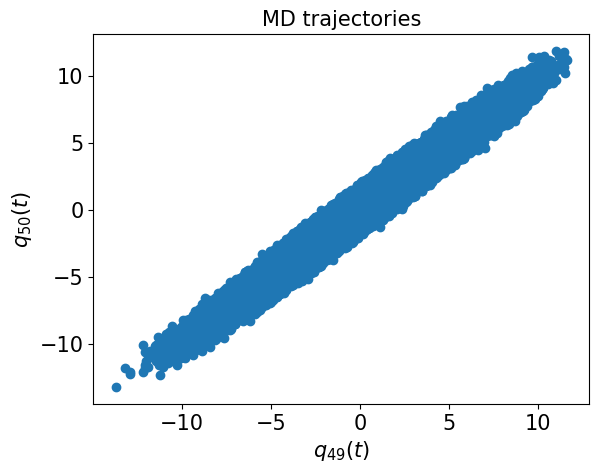

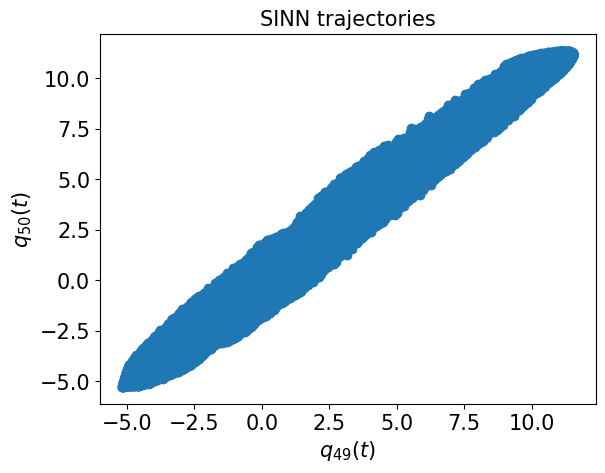

In [99]:
test6(model5)

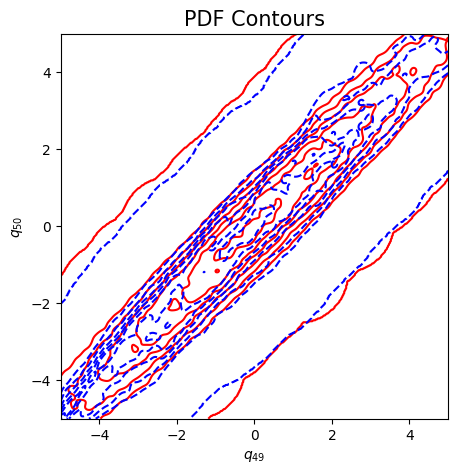

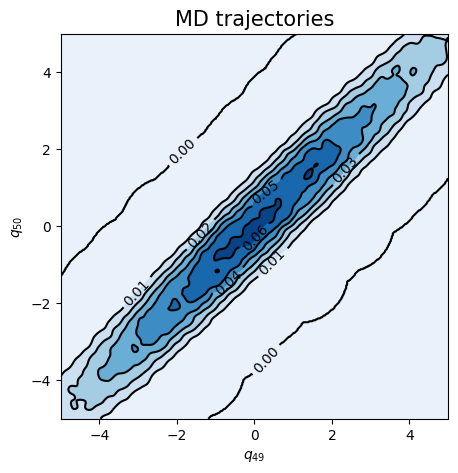

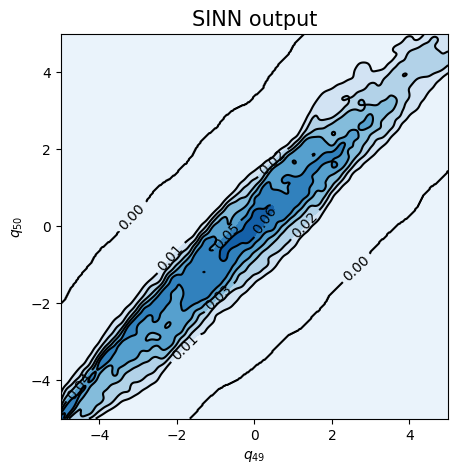

In [100]:
test7(model5)

In [ ]:
### Defining SINN model
net6 = SINN(2, 100, 5, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model6 = Model(net=net6)
model6.train()

[0]-th step loss: 0.8703, 0.8596, acf: 0.09348, ccf: 0.14503, pdf: 0.29322, pdf2: 0.28990, acf2: 0.03801
[50]-th step loss: 0.1458, 0.1368, acf: 0.05288, ccf: 0.05278, pdf: 0.00669, pdf2: 0.00558, acf2: 0.01885
[100]-th step loss: 0.0739, 0.0658, acf: 0.02451, ccf: 0.02446, pdf: 0.00243, pdf2: 0.00529, acf2: 0.00914
[150]-th step loss: 0.0566, 0.0475, acf: 0.02073, ccf: 0.02070, pdf: 0.00090, pdf2: 0.00183, acf2: 0.00334
[200]-th step loss: 0.0474, 0.0719, acf: 0.02497, ccf: 0.02491, pdf: 0.00556, pdf2: 0.01288, acf2: 0.00353
[250]-th step loss: 0.0238, 0.0167, acf: 0.00219, ccf: 0.00220, pdf: 0.00205, pdf2: 0.00549, acf2: 0.00478
[300]-th step loss: 0.0161, 0.0153, acf: 0.00431, ccf: 0.00430, pdf: 0.00090, pdf2: 0.00205, acf2: 0.00371
[350]-th step loss: 0.1823, 0.1772, acf: 0.06876, ccf: 0.06861, pdf: 0.00882, pdf2: 0.00951, acf2: 0.02153
[400]-th step loss: 0.0545, 0.0671, acf: 0.02800, ccf: 0.02794, pdf: 0.00349, pdf2: 0.00398, acf2: 0.00364
[450]-th step loss: 0.0875, 0.0695, acf:

[3850]-th step loss: 0.0304, 0.0304, acf: 0.00011, ccf: 0.00012, pdf: 0.00829, pdf2: 0.00431, acf2: 0.01756
[3900]-th step loss: 0.0257, 0.0313, acf: 0.00019, ccf: 0.00019, pdf: 0.00829, pdf2: 0.00429, acf2: 0.01838
[3950]-th step loss: 0.0286, 0.0344, acf: 0.00056, ccf: 0.00056, pdf: 0.00829, pdf2: 0.00380, acf2: 0.02116
[4000]-th step loss: 0.0310, 0.0342, acf: 0.00052, ccf: 0.00052, pdf: 0.00829, pdf2: 0.00384, acf2: 0.02107
[4050]-th step loss: 0.0301, 0.0350, acf: 0.00059, ccf: 0.00059, pdf: 0.00829, pdf2: 0.00384, acf2: 0.02165
[4100]-th step loss: 0.0341, 0.0390, acf: 0.00062, ccf: 0.00064, pdf: 0.00829, pdf2: 0.00731, acf2: 0.02211
[4150]-th step loss: 0.0301, 0.0321, acf: 0.00024, ccf: 0.00025, pdf: 0.00829, pdf2: 0.00444, acf2: 0.01889
[4200]-th step loss: 0.0241, 0.0286, acf: 0.00008, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01632
[4250]-th step loss: 0.0242, 0.0291, acf: 0.00013, ccf: 0.00013, pdf: 0.00829, pdf2: 0.00392, acf2: 0.01660
[4300]-th step loss: 0.0262,

[7650]-th step loss: 0.0310, 0.0333, acf: 0.00047, ccf: 0.00047, pdf: 0.00829, pdf2: 0.00365, acf2: 0.02041
[7700]-th step loss: 0.0324, 0.0303, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00369, acf2: 0.01793
[7750]-th step loss: 0.0304, 0.0315, acf: 0.00016, ccf: 0.00016, pdf: 0.00829, pdf2: 0.00490, acf2: 0.01796
[7800]-th step loss: 0.0303, 0.0303, acf: 0.00014, ccf: 0.00014, pdf: 0.00829, pdf2: 0.00373, acf2: 0.01795
[7850]-th step loss: 0.0246, 0.0284, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00374, acf2: 0.01619
[7900]-th step loss: 0.0298, 0.0256, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00365, acf2: 0.01344
[7950]-th step loss: 0.0268, 0.0290, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00368, acf2: 0.01681
[8000]-th step loss: 0.0311, 0.0311, acf: 0.00023, ccf: 0.00022, pdf: 0.00829, pdf2: 0.00364, acf2: 0.01869
[8050]-th step loss: 0.0273, 0.0318, acf: 0.00030, ccf: 0.00030, pdf: 0.00829, pdf2: 0.00368, acf2: 0.01922
[8100]-th step loss: 0.0257,

[11450]-th step loss: 0.0309, 0.0303, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00389, acf2: 0.01778
[11500]-th step loss: 0.0297, 0.0297, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00372, acf2: 0.01747
[11550]-th step loss: 0.0288, 0.0313, acf: 0.00024, ccf: 0.00025, pdf: 0.00829, pdf2: 0.00405, acf2: 0.01850
[11600]-th step loss: 0.0272, 0.0294, acf: 0.00012, ccf: 0.00012, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01719
[11650]-th step loss: 0.0300, 0.0621, acf: 0.00643, ccf: 0.00372, pdf: 0.00824, pdf2: 0.00382, acf2: 0.03993
[11700]-th step loss: 0.0410, 0.0403, acf: 0.00023, ccf: 0.00020, pdf: 0.00829, pdf2: 0.01773, acf2: 0.01389
[11750]-th step loss: 0.0387, 0.0410, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.01414, acf2: 0.01835
[11800]-th step loss: 0.0344, 0.0399, acf: 0.00013, ccf: 0.00013, pdf: 0.00829, pdf2: 0.01254, acf2: 0.01880
[11850]-th step loss: 0.0380, 0.0381, acf: 0.00007, ccf: 0.00008, pdf: 0.00829, pdf2: 0.01184, acf2: 0.01777
[11900]-th step los

[15250]-th step loss: 0.0321, 0.0353, acf: 0.00016, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00951, acf2: 0.01714
[15300]-th step loss: 0.0320, 0.0366, acf: 0.00027, ccf: 0.00028, pdf: 0.00829, pdf2: 0.00950, acf2: 0.01825
[15350]-th step loss: 0.0316, 0.0348, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00956, acf2: 0.01666
[15400]-th step loss: 0.0305, 0.0354, acf: 0.00020, ccf: 0.00020, pdf: 0.00829, pdf2: 0.00942, acf2: 0.01732
[15450]-th step loss: 0.0321, 0.0362, acf: 0.00026, ccf: 0.00026, pdf: 0.00829, pdf2: 0.00939, acf2: 0.01797
[15500]-th step loss: 0.0306, 0.0345, acf: 0.00014, ccf: 0.00014, pdf: 0.00829, pdf2: 0.00946, acf2: 0.01647
[15550]-th step loss: 0.0318, 0.0366, acf: 0.00029, ccf: 0.00029, pdf: 0.00829, pdf2: 0.00944, acf2: 0.01832
[15600]-th step loss: 0.0353, 0.0358, acf: 0.00022, ccf: 0.00023, pdf: 0.00829, pdf2: 0.00949, acf2: 0.01762
[15650]-th step loss: 0.0338, 0.0367, acf: 0.00028, ccf: 0.00029, pdf: 0.00829, pdf2: 0.00954, acf2: 0.01827
[15700]-th step los

[19050]-th step loss: 0.0321, 0.0355, acf: 0.00026, ccf: 0.00026, pdf: 0.00829, pdf2: 0.00946, acf2: 0.01721
[19100]-th step loss: 0.0318, 0.0357, acf: 0.00027, ccf: 0.00027, pdf: 0.00829, pdf2: 0.00950, acf2: 0.01733
[19150]-th step loss: 0.0307, 0.0360, acf: 0.00030, ccf: 0.00030, pdf: 0.00829, pdf2: 0.00953, acf2: 0.01763
[19200]-th step loss: 0.0339, 0.0357, acf: 0.00027, ccf: 0.00028, pdf: 0.00829, pdf2: 0.00952, acf2: 0.01738


In [ ]:
draw_loss(model6)

In [ ]:
draw_errors(model6)

In [ ]:
draw_adaptive_w(model6)
draw_epoch_w(model6)

In [ ]:
test1(model6)

In [ ]:
test2(model6)

In [ ]:
test3(model6)

In [ ]:
test4(model6)

In [ ]:
test5(model6)

In [ ]:
test6(model6)

In [ ]:
test7(model6)

In [ ]:
### Defining SINN model
net7 = SINN(2, 100, 5, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model7 = Model(net=net7)
model7.train()

In [ ]:
draw_loss(model7)

In [ ]:
draw_errors(model7)

In [ ]:
draw_adaptive_w(model7)
draw_epoch_w(model7)

In [ ]:
test1(model7)

In [ ]:
test2(model7)

In [ ]:
test3(model7)

In [ ]:
test4(model7)

In [ ]:
test5(model7)

In [ ]:
test6(model7)

In [ ]:
test7(model7)

In [ ]:
### Defining SINN model
net8 = SINN(2, 100, 5, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model8 = Model(net=net8)
model8.train()

In [ ]:
draw_loss(model8)

In [ ]:
draw_errors(model8)

In [ ]:
draw_adaptive_w(model8)
draw_epoch_w(model8)

In [ ]:
test1(model8)

In [ ]:
test2(model8)

In [ ]:
test3(model8)

In [ ]:
test4(model8)

In [ ]:
test5(model8)

In [ ]:
test6(model8)

In [ ]:
test7(model8)

In [ ]:
### Defining SINN model
net9 = SINN(2, 100, 5, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model9 = Model(net=net9)
model9.train()

In [ ]:
draw_loss(model9)

In [ ]:
draw_errors(model9)

In [ ]:
draw_adaptive_w(model9)
draw_epoch_w(model9)

In [ ]:
test1(model9)

In [ ]:
test2(model9)

In [ ]:
test3(model9)

In [ ]:
test4(model9)

In [ ]:
test5(model9)

In [ ]:
test6(model9)

In [ ]:
test7(model9)